# DeepLabCut Toolbox
https://github.com/AlexEMG/DeepLabCut

Nath\*, Mathis\* et al. *Using DeepLabCut for markerless pose estimation during behavior across species*, (under revision).

This notebook demonstrates the necessary steps to use DeepLabCut for your own project.
This shows the most simple code to do so, but many of the functions have additional features, so please check out the overview & the protocol paper!

This notebook illustrates how to:
- create a project
- extract training frames
- label the frames
- plot the labeled images
- create a training set
- train a network
- evaluate a network
- analyze a novel video
- create an automatically labeled video 
- plot the trajectories

*Note*: Refine a network based after the network was trained on just a few labeled images is illustrated in "Demo-labeledexample-MouseReaching.ipynb". This demo also contains an already labeled data set and is perhaps the best starting point for brand new users.

## Create a new project

It is always good idea to keep the projects seperate. This function creates a new project with subdirectories and a basic configuration file in the user defined directory otherwise the project is created in the current working directory.

You can always add new videos to the project at any stage of the project. 

In [1]:
import deeplabcut

In [2]:
task='LinearChamber' # Enter the name of your experiment Task
experimenter='KAIST' # Enter the name of the experimenter
video=['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg'] # Enter the paths of your videos you want to grab frames from.
deeplabcut.create_new_project(task,experimenter,video, working_directory='C:\\Users\\user\\Desktop',copy_videos=False) #change the working directory to where you want the folders created.

Created "C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\videos"
Created "C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data"
Created "C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\training-datasets"
Created "C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models"
Creating the symbolic link of the video
Created the symlink of C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial1.mpg to C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\videos\20180906_Trial1.mpg
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\videos\20180906_Trial1.mpg
Generated "C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\config.yaml"

A new project with name LinearChamber-KAIST-2018-11-19 is created at C:\Users\user\Desktop and a configurable file (config.yaml) is stored there. Change the parameters in this file to adapt to your project's needs.
 Once you have changed the configuration file, use the function 'extract_frames' to select f

'C:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\config.yaml'

In [3]:
#Linear Chamber
Experiment_Days=['20180906','20180910','20180919']
for day_index in range(len(Experiment_Days)):
    day=Experiment_Days[day_index]
    for i in range(1,16):
        #index=day_index*15+i
        if day=='20180906' and i==1:
            continue
        deeplabcut.add_new_videos('C:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\config.yaml',['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\'+day+'\\'+day+'_Trial'+str(i)+'.mpg'],copy_videos=False)

Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
Creating the symbolic link of the video
New video was added to the project! Use the function 'extract_frames' to select frames for labeling.
Creating the 

## Extract frames from videos 
A key point for a successful feature detector is to select diverse frames, which are typical for the behavior you study that should be labeled.

This function selects N frames either uniformly sampled from a particular video (or folder) (algo=='uniform'). Note: this might not yield diverse frames, if the behavior is sparsely distributed (consider using kmeans), and/or select frames manually etc.

Also make sure to get select data from different (behavioral) sessions and different animals if those vary substantially (to train an invariant feature detector).

Individual images should not be too big (i.e. < 850 x 850 pixel). Although this can be taken care of later as well, it is advisable to crop the frames, to remove unnecessary parts of the frame as much as possible.

Always check the output of cropping. If you are happy with the results proceed to labeling.

In [2]:
%matplotlib inline
#path_config_file = 'C:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\config.yaml'
path_config_file = 'D:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\config.yaml'

In [4]:
deeplabcut.extract_frames(path_config_file,'automatic','uniform',crop=True, checkcropping=False) #there are other ways to grab frames, such as by clustering 'kmeans'; please see the paper. 
#You can change the cropping to false, then delete the checkcropping part!

Reading config file successfully...
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on uniform ...
Uniformly extracting of frames from 0.0  seconds to 600.12  seconds.
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on uniform ...
Uniformly extracting of frames from 0.0  seconds to 600.61  seconds.
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on uniform ...
Uniformly extracting of frames from 0.0  seconds to 600.6  seconds.
Make sure you change the crop parameters in the config.yaml file. The default parameters are set to the video dimensions.
Extracting frames based on uniform ...
Uniformly extracting of frames from 0.0  seconds to 600.6  seconds.
Make sure you change the crop parameters in th

## Label the extracted frames
Only videos in the config file can be used to extract the frames. Extracted labels for each video are stored in the project directory under the subdirectory **'labeled-data'**. Each subdirectory is named after the name of the video. The toolbox has a labeling toolbox which could be used for labeling. 

In [ ]:
%gui wx
deeplabcut.label_frames(path_config_file, Screens=2, winHack=0.5)

**Check the labels**

Checking if the labels were created and stored correctly is beneficial for training, since labeling is one of the most critical parts for creating the training dataset. The DeepLabCut toolbox provides a function `check\_labels'  to do so. It is used as follows:

In [ ]:
deeplabcut.check_labels(path_config_file) #this creates a subdirectory with the frames + your labels

Creating images with labels by KAIST.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial1_labeled  already exists!
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial1_labeled.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial1_labeled  already exists!
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial1_labeled.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial10_labeled  already exists!
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial10_labeled.
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial11_labeled  already exists!
They are stored in the following folder: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180906_Trial11_labeled.
C:

If the labels need adjusted, you can use the refinement GUI to move them around! Check that out below.

## Create a training dataset
This function generates the training data information for DeepCut (which requires a mat file) based on the pandas dataframes that hold label information. The user can set the fraction of the training set size (from all labeled image in the hd5 file) in the config.yaml file. While creating the dataset, the user can create multiple shuffles. 

After running this script the training dataset is created and saved in the project directory under the subdirectory **'training-datasets'**

This function also creates new subdirectories under **dlc-models** and appends the project config.yaml file with the correct path to the training and testing pose configuration file. These files hold the parameters for training the network. Such an example file is provided with the toolbox and named as **pose_cfg.yaml**.

Now it is the time to start training the network!

In [9]:
deeplabcut.create_training_dataset(path_config_file)

C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\training-datasets\iteration-2\UnaugmentedDataSet_LinearChamberNov19  already exists!


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\labeled-data\\20180906_Trial1\\img16890.png'

## Start training - If you want to use a CPU, continue. 
### If yu want to use your GPU, you need to exit here and either work from the Docker container, your own TensorFlow installation in an Anaconda env

This function trains the network for a specific shuffle of the training dataset. 

In [ ]:
#max_iter: c:\users\user\Anaconda3\envs\DLC2\Lib\site-packages\deeplabcut\pose_estimation_tensorflow\train.py에서 수정 가능.
#snapshot 위치: C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-0\LinearChamberNov19-trainset95shuffle1\train
#중간부터 retraining 하고 싶은 경우
#C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-0\LinearChamberNov19-trainset95shuffle1\train에서 pose_cfg.yaml을 찾아 init_weights를 다음과 같이 바꾼다.
#C:\Users\user\Anaconda3\envs\DLC2\lib\sitepackages\deeplabcut\pose_estimation_tensorflow\models\pretrained\resnet_v1_50.ckpt
deeplabcut.train_network(path_config_file, gputouse=0, max_snapshots_to_keep=None)

Config:
{'all_joints': [[0], [1], [2], [3]],
 'all_joints_names': ['Snout', 'LeftEar', 'RightEar', 'TailBase'],
 'batch_size': 1,
 'bottomheight': 400,
 'crop': True,
 'crop_pad': 0,
 'cropratio': 0.4,
 'dataset': 'training-datasets\\iteration-3\\UnaugmentedDataSet_LinearChamberNov19\\LinearChamber_KAIST80shuffle1.mat',
 'dataset_type': 'default',
 'display_iters': 1000,
 'fg_fraction': 0.25,
 'global_scale': 0.8,
 'init_weights': 'C:\\Users\\user\\Desktop\\train\\snapshot-200000',
 'intermediate_supervision': False,
 'intermediate_supervision_layer': 12,
 'leftwidth': 400,
 'location_refinement': True,
 'locref_huber_loss': True,
 'locref_loss_weight': 0.05,
 'locref_stdev': 7.2801,
 'log_dir': 'log',
 'max_input_size': 1000,
 'mean_pixel': [123.68, 116.779, 103.939],
 'metadataset': 'training-datasets\\iteration-3\\UnaugmentedDataSet_LinearChamberNov19\\Documentation_data-LinearChamber_80shuffle1.pickle',
 'minsize': 100,
 'mirror': False,
 'multi_step': [[0.005, 10000],
            

INFO:tensorflow:Restoring parameters from C:\Users\user\Desktop\train\snapshot-200000


Restoring parameters from C:\Users\user\Desktop\train\snapshot-200000


Training parameter:
{'stride': 8.0, 'weigh_part_predictions': False, 'weigh_negatives': False, 'fg_fraction': 0.25, 'weigh_only_present_joints': False, 'mean_pixel': [123.68, 116.779, 103.939], 'shuffle': True, 'snapshot_prefix': 'C:\\Users\\user\\Desktop\\LinearChamber-KAIST-2018-11-19\\dlc-models\\iteration-3\\LinearChamberNov19-trainset80shuffle1\\train\\snapshot', 'log_dir': 'log', 'global_scale': 0.8, 'location_refinement': True, 'locref_stdev': 7.2801, 'locref_loss_weight': 0.05, 'locref_huber_loss': True, 'optimizer': 'sgd', 'intermediate_supervision': True, 'intermediate_supervision_layer': 12, 'regularize': True, 'weight_decay': 0.001, 'mirror': False, 'crop_pad': 0, 'scoremap_dir': 'test', 'dataset_type': 'default', 'use_gt_segm': False, 'batch_size': 1, 'video': False, 'video_batch': False, 'crop': True, 'cropratio': 0.4, 'minsize': 100, 'leftwidth': 400, 'rightwidth': 400, 'topheight': 400, 'bottomheight': 400, 'all_joints': [[0], [1], [2], [3]], 'all_joints_names': ['Snout

iteration: 50000 loss: 0.0083 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-50000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-50000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 100000 loss: 0.0063 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-100000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-100000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 150000 loss: 0.0057 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-150000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-150000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 200000 loss: 0.0052 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-200000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-200000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 250000 loss: 0.0049 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-250000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-250000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 300000 loss: 0.0046 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-300000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-300000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 350000 loss: 0.0044 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-350000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-350000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 400000 loss: 0.0041 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-400000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-400000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 450000 loss: 0.0040 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-450000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-450000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 500000 loss: 0.0038 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-500000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-500000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 550000 loss: 0.0036 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-550000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-550000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 600000 loss: 0.0035 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-600000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-600000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 650000 loss: 0.0034 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-650000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-650000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 700000 loss: 0.0033 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-700000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-700000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 750000 loss: 0.0032 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-750000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-750000 is not in all_model_checkpoint_paths. Manually adding it.
iteration: 800000 loss: 0.0031 lr: 0.001


INFO:tensorflow:C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-800000 is not in all_model_checkpoint_paths. Manually adding it.


C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-800000 is not in all_model_checkpoint_paths. Manually adding it.


## Start evaluating
This funtion evaluates a trained model for a specific shuffle/shuffles at a particular state or all the states on the data set (images)
and stores the results as .csv file in a subdirectory under **evaluation-results**

In [3]:
deeplabcut.evaluate_network(path_config_file, plotting=False, gputouse=0)

D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19/evaluation-results/  already exists!
D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\evaluation-results\iteration-3\LinearChamberNov19-trainset80shuffle1  already exists!
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_5000  with # of trainingiterations: 5000
This net has already been evaluated!
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_10000  with # of trainingiterations: 10000
This net has already been evaluated!
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_15000  with # of trainingiterations: 15000
This net has already been evaluated!
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_20000  with # of trainingiterations: 20000
This net has already been evaluated!
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_25000  with # of trainingiterations: 25000
This net has already been evaluated!
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_30000  with # of trainingiterations: 30000
This n

INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-250000


Analyzing data...


1290it [01:06, 19.54it/s]


Done and results stored for snapshot:  snapshot-250000
Results for 250000  training iterations: 80 1 train error: 2.07 pixels. Test error: 6.0  pixels.
With pcutoff of 0.1  train error: 2.07 pixels. Test error: 5.36 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_300000  with # of trainingiterations: 300000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-300000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-300000


Analyzing data...


1290it [01:06, 23.14it/s]


Done and results stored for snapshot:  snapshot-300000
Results for 300000  training iterations: 80 1 train error: 2.38 pixels. Test error: 6.19  pixels.
With pcutoff of 0.1  train error: 2.38 pixels. Test error: 5.69 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_350000  with # of trainingiterations: 350000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-350000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-350000


Analyzing data...


1290it [01:06, 19.51it/s]


Done and results stored for snapshot:  snapshot-350000
Results for 350000  training iterations: 80 1 train error: 2.36 pixels. Test error: 6.32  pixels.
With pcutoff of 0.1  train error: 2.36 pixels. Test error: 5.56 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_400000  with # of trainingiterations: 400000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-400000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-400000


Analyzing data...


1290it [01:06, 19.52it/s]


Done and results stored for snapshot:  snapshot-400000
Results for 400000  training iterations: 80 1 train error: 2.19 pixels. Test error: 6.29  pixels.
With pcutoff of 0.1  train error: 2.19 pixels. Test error: 5.47 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_450000  with # of trainingiterations: 450000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-450000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-450000


Analyzing data...


1290it [01:07, 19.15it/s]


Done and results stored for snapshot:  snapshot-450000
Results for 450000  training iterations: 80 1 train error: 1.94 pixels. Test error: 5.95  pixels.
With pcutoff of 0.1  train error: 1.94 pixels. Test error: 5.33 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_500000  with # of trainingiterations: 500000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-500000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-500000


Analyzing data...


1290it [01:05, 19.58it/s]


Done and results stored for snapshot:  snapshot-500000
Results for 500000  training iterations: 80 1 train error: 1.91 pixels. Test error: 6.1  pixels.
With pcutoff of 0.1  train error: 1.91 pixels. Test error: 5.53 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_550000  with # of trainingiterations: 550000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-550000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-550000


Analyzing data...


1290it [01:07, 19.11it/s]


Done and results stored for snapshot:  snapshot-550000
Results for 550000  training iterations: 80 1 train error: 1.95 pixels. Test error: 6.04  pixels.
With pcutoff of 0.1  train error: 1.95 pixels. Test error: 5.43 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_600000  with # of trainingiterations: 600000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-600000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-600000


Analyzing data...


1290it [01:05, 23.00it/s]


Done and results stored for snapshot:  snapshot-600000
Results for 600000  training iterations: 80 1 train error: 2.01 pixels. Test error: 6.3  pixels.
With pcutoff of 0.1  train error: 2.01 pixels. Test error: 5.47 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_650000  with # of trainingiterations: 650000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-650000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-650000


Analyzing data...


1290it [01:06, 19.36it/s]


Done and results stored for snapshot:  snapshot-650000
Results for 650000  training iterations: 80 1 train error: 1.85 pixels. Test error: 5.93  pixels.
With pcutoff of 0.1  train error: 1.85 pixels. Test error: 5.47 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_700000  with # of trainingiterations: 700000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-700000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-700000


Analyzing data...


1290it [01:07, 19.13it/s]


Done and results stored for snapshot:  snapshot-700000
Results for 700000  training iterations: 80 1 train error: 1.7 pixels. Test error: 6.04  pixels.
With pcutoff of 0.1  train error: 1.7 pixels. Test error: 5.44 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_750000  with # of trainingiterations: 750000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-750000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-750000


Analyzing data...


1290it [01:08, 18.75it/s]


Done and results stored for snapshot:  snapshot-750000
Results for 750000  training iterations: 80 1 train error: 1.87 pixels. Test error: 6.01  pixels.
With pcutoff of 0.1  train error: 1.87 pixels. Test error: 5.4 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Running  DeepCut_resnet101_LinearChamberNov19shuffle1_800000  with # of trainingiterations: 800000
INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-800000


INFO:tensorflow:Restoring parameters from D:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-3\LinearChamberNov19-trainset80shuffle1\train\snapshot-800000


Analyzing data...


1290it [01:06, 19.40it/s]


Done and results stored for snapshot:  snapshot-800000
Results for 800000  training iterations: 80 1 train error: 1.76 pixels. Test error: 6.07  pixels.
With pcutoff of 0.1  train error: 1.76 pixels. Test error: 5.46 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
The network is evaluated and the results are stored in the subdirectory 'evaluation_results'.
If it generalizes well, choose the best model for prediction and update the config file with the appropriate index for the 'snapshotindex'.
Use the function 'analyze_video' to make predictions on new videos.
Otherwise consider retraining the network (see DeepLabCut workflow Fig 2)


## Start Analyzing videos
This function analyzes the new video. The user can choose the best model from the evaluation results and specify the correct snapshot index for the variable **snapshotindex** in the **config.yaml** file. Otherwise, by default the most recent snapshot is used to analyse the video.

The results are stored in hd5 file in the same directory where the video resides. 

In [3]:
#Linear Chamber(all)
videofile_path = [] #Enter the list of videos to analyze.
Experiment_Days=['20180906','20180910','20180919']
for day_index in range(len(Experiment_Days)):
    day=Experiment_Days[day_index]
    for i in range(1,16):
        videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\'+day+'\\'+day+'_Trial'+str(i)+'.mpg')
# videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg')
# videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg')

In [3]:
#Linear Chamber(only 20180919)
videofile_path = [] #Enter the list of videos to analyze.
Experiment_Days=['20180906','20180910','20180919']
for day_index in range(len(Experiment_Days)):
    day=Experiment_Days[day_index]
    for i in range(1,16):
        if day_index==2:
            videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\'+day+'\\'+day+'_Trial'+str(i)+'.mpg')

In [14]:
#Linear Chamber(one)
videofile_path = [] #Enter the list of videos to analyze.
videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg')
#videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg')

In [3]:
#Season 2(all)
import os

def get_full_filenames(dirname, extension='None'):
    full_filenames=[]
    filenames = os.listdir(dirname)
    for filename in filenames:
        full_filename = os.path.join(dirname, filename)
        
        if extension != "None":
            ext = os.path.splitext(full_filename)[-1]
            if extension==ext: 
                full_filenames.append(full_filename)
        else:
            full_filenames.append(full_filename)
    return full_filenames

videofile_path=[]
full_foldernames=get_full_filenames("C:\\Users\\user\\Desktop\\Video_files_other")
for full_foldername in full_foldernames:
    full_videonames=get_full_filenames(full_foldername, extension='.mpg')
    videofile_path.extend(full_videonames)

In [8]:
#Season 2(one)
videofile_path = [] #Enter the list of videos to analyze.
videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg')
videofile_path.append('C:\\Users\\user\\Desktop\\Video_files_other\\20180205(coh1)_RedHat\\20180205(coh1)_Trial1.mpg')
print(videofile_path)

['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180205(coh1)_RedHat\\20180205(coh1)_Trial1.mpg']


In [4]:
deeplabcut.analyze_videos(path_config_file,videofile_path, videotype='.mpg', gputouse=0, save_as_csv=True)

Using snapshot-400000 for model C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1
INFO:tensorflow:Restoring parameters from C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-400000


INFO:tensorflow:Restoring parameters from C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\dlc-models\iteration-2\LinearChamberNov19-trainset95shuffle1\train\snapshot-400000


C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial5.mpg
Video already analyzed! C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial5DeepCut_resnet101_LinearChamberNov19shuffle1_400000.h5
C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial7.mpg
Video already analyzed! C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial7DeepCut_resnet101_LinearChamberNov19shuffle1_400000.h5
C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Trial8.mpg
Video already analyzed! C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet\20171229(coh1)_Tr

Video already analyzed! C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial2DeepCut_resnet101_LinearChamberNov19shuffle1_400000.h5
C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial3.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial3.mpg
Video already analyzed! C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial3DeepCut_resnet101_LinearChamberNov19shuffle1_400000.h5
C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial4.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial4.mpg
Video already analyzed! C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial4DeepCut_resnet101_LinearChamberNov19shuffle1_400000.h5
C:\Users\user\Desktop\Video_files_other\20180726(coh2)_same\20180726(coh2)_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180726(coh2)

18079it [04:42, 63.67it/s]                                                                                             

Detected frames:  17972
Saving results in C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same...
Saving csv poses!
C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial5.mpg
Loading  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial5.mpg
Duration of video [s]:  600.73 , recorded with  29.97 fps!
Overall # of frames:  18004 without cropped frame dimensions:  704 480
Starting to extract posture
Cropping based on the x1 = 0 x2 = 704 y1 = 50 y2 = 270. You can adjust the cropping coordinates in the config.yaml file.



  5%|███▉                                                                          | 900/18004 [00:11<03:41, 77.21it/s]
18079it [05:00, 63.67it/s]                                                        | 1080/18004 [00:14<03:52, 72.80it/s]
100%|███████████████████████████████████████████████████████████████████████████▉| 18000/18004 [04:36<00:00, 64.52it/s]
18180it [04:39, 64.52it/s]                                                                                             

Detected frames:  18004
Saving results in C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same...
Saving csv poses!
C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial6.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial6.mpg
Loading  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial6.mpg
Duration of video [s]:  600.5 , recorded with  29.97 fps!
Overall # of frames:  17997 without cropped frame dimensions:  704 480
Starting to extract posture
Cropping based on the x1 = 0 x2 = 704 y1 = 50 y2 = 270. You can adjust the cropping coordinates in the config.yaml file.




  0%|                                                                                        | 0/17997 [00:00<?, ?it/s]

  2%|█▌                                                                           | 358/17997 [00:02<02:15, 130.01it/s]

  3%|██▎                                                                           | 537/17997 [00:05<02:55, 99.43it/s]

  4%|███                                                                           | 716/17997 [00:08<03:22, 85.26it/s]

  5%|███▉                                                                          | 895/17997 [00:11<03:40, 77.72it/s]

  6%|████▌                                                                        | 1074/17997 [00:13<03:50, 73.55it/s]
18180it [04:56, 64.52it/s]

  7%|█████▎                                                                       | 1253/17997 [00:16<03:57, 70.41it/s]

  8%|██████▏                                                                      | 1432/17997 [00:19<04:02, 68.33it/s]

  9

Detected frames:  17997
Saving results in C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same...
Saving csv poses!
C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial7.mpg
Loading  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial7.mpg
Duration of video [s]:  600.77 , recorded with  29.97 fps!
Overall # of frames:  18005 without cropped frame dimensions:  704 480
Starting to extract posture
Cropping based on the x1 = 0 x2 = 704 y1 = 50 y2 = 270. You can adjust the cropping coordinates in the config.yaml file.





  0%|                                                                                        | 0/18005 [00:00<?, ?it/s]


  2%|█▌                                                                           | 360/18005 [00:02<02:18, 127.14it/s]


  3%|██▎                                                                           | 540/18005 [00:05<02:57, 98.25it/s]


  4%|███                                                                           | 720/18005 [00:08<03:24, 84.55it/s]


  5%|███▉                                                                          | 900/18005 [00:11<03:41, 77.29it/s]


  6%|████▌                                                                        | 1080/18005 [00:14<03:52, 72.80it/s]

18079it [04:56, 64.03it/s]


  7%|█████▍                                                                       | 1260/18005 [00:16<03:59, 69.91it/s]


  8%|██████▏                                                                      | 1440/18005 [00:19<04:03, 67.99i

Detected frames:  18005
Saving results in C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same...
Saving csv poses!
C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial8.mpg
Loading  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial8.mpg
Duration of video [s]:  600.17 , recorded with  29.97 fps!
Overall # of frames:  17987 without cropped frame dimensions:  704 480
Starting to extract posture
Cropping based on the x1 = 0 x2 = 704 y1 = 50 y2 = 270. You can adjust the cropping coordinates in the config.yaml file.






  0%|                                                                                        | 0/17987 [00:00<?, ?it/s]



  2%|█▌                                                                           | 358/17987 [00:02<02:16, 129.59it/s]



  3%|██▎                                                                           | 537/17987 [00:05<02:55, 99.20it/s]



  4%|███                                                                           | 716/17987 [00:08<03:22, 85.12it/s]



  5%|███▉                                                                          | 895/17987 [00:11<03:40, 77.44it/s]



  6%|████▌                                                                        | 1074/17987 [00:13<03:50, 73.32it/s]



  7%|█████▎                                                                       | 1253/17987 [00:16<03:57, 70.34it/s]


18180it [04:56, 64.69it/s]



  8%|██████▏                                                                      | 1432/17987 [00:19<04:0

Detected frames:  17987
Saving results in C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same...
Saving csv poses!
C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial9.mpg
Starting %  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial9.mpg
Loading  C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same\20180727(coh2)_Trial9.mpg
Duration of video [s]:  552.55 , recorded with  29.97 fps!
Overall # of frames:  16560 without cropped frame dimensions:  704 480
Starting to extract posture
Cropping based on the x1 = 0 x2 = 704 y1 = 50 y2 = 270. You can adjust the cropping coordinates in the config.yaml file.







  0%|                                                                                        | 0/16560 [00:00<?, ?it/s]




  2%|█▌                                                                           | 330/16560 [00:02<02:07, 127.36it/s]




  3%|██▎                                                                           | 495/16560 [00:05<02:42, 98.60it/s]




  4%|███                                                                           | 660/16560 [00:07<03:06, 85.27it/s]




  5%|███▉                                                                          | 825/16560 [00:10<03:23, 77.29it/s]




  6%|████▋                                                                         | 990/16560 [00:12<03:33, 73.05it/s]



18079it [04:56, 63.96it/s]




  7%|█████▎                                                                       | 1155/16560 [00:15<03:39, 70.16it/s]




  8%|██████▏                                                                      | 1320/16560 [0

Detected frames:  16560
Saving results in C:\Users\user\Desktop\Video_files_other\20180727(coh2)_same...
Saving csv poses!
The videos are analyzed. Now your research can truly start! 
 You can create labeled videos with 'create_labeled_video'.
If the tracking is not satisfactory for some videos, consider expanding the training set. You can use the function 'extract_outlier_frames' to extract any outlier frames!







16665it [04:34, 64.32it/s]

## Extract outlier frames [optional step]
This is an optional step and is used only when the evaluation results are poor i.e. the labels are incorrectly predicted. In such a case, the user can use the following function to extract frames where the labels are incorrectly predicted. Make sure to provide the correct value of the "iterations" as it will be used to create the unique directory where the extracted frames will be saved.

In [4]:
deeplabcut.extract_outlier_frames(path_config_file,videofile_path, outlieralgorithm='jump', comparisonbodyparts=["Snout", "TailBase"], epsilon=120, automatic=False)

network parameters: DeepCut_resnet101_LinearChamberNov19shuffle1_1030000
Method  jump  found  1  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, epsilon, comparisonbodyparts) or use a different method.
yes/noy
Frames from video 20180906_Trial1  already extracted (more will be added)!
Loading video...
Duration of video [s]:  600.12 , recorded @  30.0 fps!
Overall # of frames:  17986 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.12  seconds.
Let's select frames indices: [861]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial1.mpg Coordinates for cropping: (0, 704, 50, 270)
The outlier frames are extracted. They are stored 

In [7]:
deeplabcut.extract_outlier_frames(path_config_file,videofile_path, outlieralgorithm='uncertain', comparisonbodyparts=["Snout", "TailBase"], p_bound=0.000002, automatic=True)

network parameters: DeepCut_resnet101_LinearChamberNov19shuffle1_1030000
Method  uncertain  found  30  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, p_bound, comparisonbodyparts) or use a different method.
Frames from video 20180906_Trial1  already extracted (more will be added)!
Loading video...
Duration of video [s]:  600.12 , recorded @  30.0 fps!
Overall # of frames:  17986 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.12  seconds.
Let's select frames indices: [3865, 16629, 16618, 16628, 8440, 15767, 16630, 15764, 7704, 15771]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial1.mpg Coordinates for cropping: (0, 704,

Overall # of frames:  17989 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.24  seconds.
Let's select frames indices: [7075, 7072, 7085, 7071, 7099, 7089, 1208, 7103, 7079, 7095]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial15.mpg Coordinates for cropping: (0, 704, 50, 270)
The outlier frames are extracted. They are stored in the subdirectory labeled-data\20180906_Trial15.
Once you extracted frames for all videos, use 'refine_labels' to manually correct the labels.
Method  uncertain  found  34  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (start, stop, p_bound, comparisonbodyparts) or use a different method.
Frames from video 201

Frames from video 20180919_Trial1  already extracted (more will be added)!
Loading video...
Duration of video [s]:  600.59 , recorded @  30.0 fps!
Overall # of frames:  18000 with (cropped) frame dimensions:  (704, 430)
Uniformly extracting of frames from 0.0  seconds to 600.59  seconds.
Let's select frames indices: [3883]
Creating the symbolic link of the video
AUTOMATIC ADDING OF VIDEO TO CONFIG FILE FAILED! You need to do this manually for including it in the config.yaml file!
Videopath: C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial1.mpg Coordinates for cropping: (0, 704, 50, 270)
The outlier frames are extracted. They are stored in the subdirectory labeled-data\20180919_Trial1.
Once you extracted frames for all videos, use 'refine_labels' to manually correct the labels.
Method  uncertain  found  11  putative outlier frames.
Do you want to proceed with extracting  10  of those?
If this list is very large, perhaps consider changing the paramters (

## Refine Labels [optional step]
Following the extraction of outlier frames, the user can use the following function to move the predicted labels to the correct location. Thus augmenting the training dataset.

In [3]:
%gui wx
deeplabcut.refine_labels(path_config_file, Screens=2, winHack=0.5)

C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180919_Trial5
Checking labels if they are outside the image
A training dataset file is already found for this video. The refined machine labels are merged to this data!
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180919_Trial6
Checking labels if they are outside the image
A training dataset file is already found for this video. The refined machine labels are merged to this data!
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180919_Trial7
Checking labels if they are outside the image
A training dataset file is already found for this video. The refined machine labels are merged to this data!
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19\labeled-data\20180919_Trial8
Checking labels if they are outside the image
A training dataset file is already found for this video. The refined machine labels are merged to this data!
C:\Users\user\Desktop\LinearChamber-KAIST-2018-11-19

RuntimeError: wrapped C/C++ object of type FileDialog has been deleted

In [4]:
#Once all folders are relabeled, check them and advance. See how to check labels, above!
deeplabcut.merge_datasets(path_config_file)

Merged data sets and updated refinement iteration to 3.
Now you can create a new training set for the expanded annotated images (use create_training_dataset).


## Create a new iteration of training dataset [optional step]
Following the refine labels, append these frames to the original dataset to create a new iteration of training dataset.

In [5]:
deeplabcut.create_training_dataset(path_config_file)

The training dataset is successfully created. Use the function 'train_network' to start training. Happy training!


## Create labeled video
This funtion is for visualiztion purpose and can be used to create a video in .mp4 format with labels predicted by the network. This video is saved in the same directory where the original video resides. 

In [ ]:
#videofile_path=['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg']
deeplabcut.create_labeled_video(path_config_file,videofile_path, videotype='mpg', save_frames = True, delete=False, displayedbodyparts=['Snout','TailBase'])

Starting %  C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20171229(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180104(coh1)_WireNet ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_

Starting %  C:\Users\user\Desktop\Video_files_other\20180205(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_o

Starting %  C:\Users\user\Desktop\Video_files_other\20180205(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_o

Starting %  C:\Users\user\Desktop\Video_files_other\20180205(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_o

Starting %  C:\Users\user\Desktop\Video_files_other\20180205(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_o

100%|██████████████████████████████████████████████████████████████████████████| 18000/18000 [00:11<00:00, 1509.17it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180205(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(co

100%|████████████████████████████████████████████████████████████████████████████| 18000/18000 [19:18<00:00, 15.54it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180208(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(co

100%|████████████████████████████████████████████████████████████████████████████| 17987/17987 [24:34<00:00, 12.20it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180208(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(co

100%|████████████████████████████████████████████████████████████████████████████| 18000/18000 [33:17<00:00,  8.73it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180208(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(co

100%|████████████████████████████████████████████████████████████████████████████| 18000/18000 [49:44<00:00,  6.86it/s]


All labeled frames were created, now generating video...
Starting %  C:\Users\user\Desktop\Video_files_other\20180208(coh1)_RedHat ['C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20171229(coh1)_WireNet\\20171229(coh1)_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial10.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial11.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial12.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(coh1)_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_other\\20180104(coh1)_WireNet\\20180104(co

 48%|█████████████████████████████████████▏                                       | 8705/18004 [24:03<25:48,  6.00it/s]

## Plot the trajectories of the analyzed videos
This function plots the trajectories of all the body parts across the entire video. Each body part is identified by a unique color.

C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial1.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial8.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabc

<IPython.core.display.Javascript object>


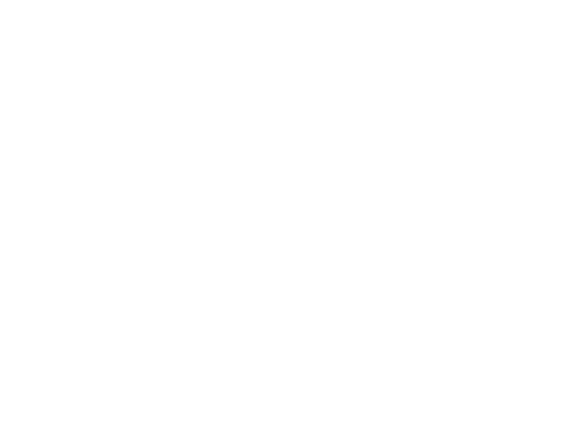

<IPython.core.display.Javascript object>


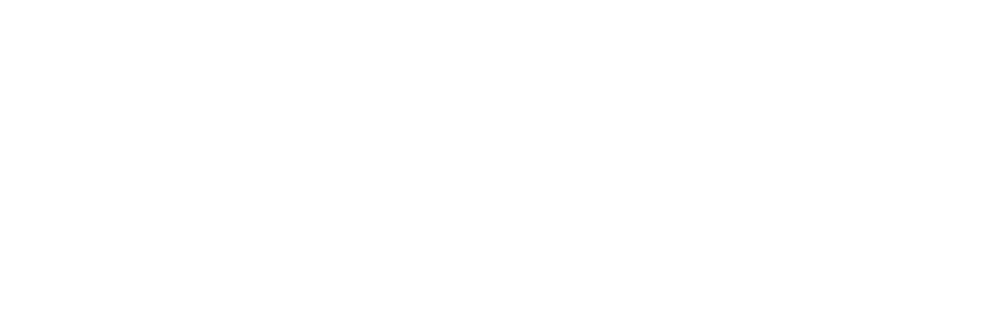

<IPython.core.display.Javascript object>


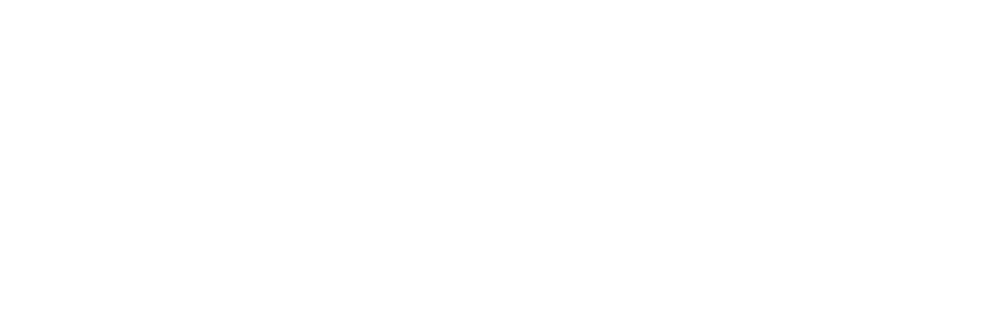

<IPython.core.display.Javascript object>


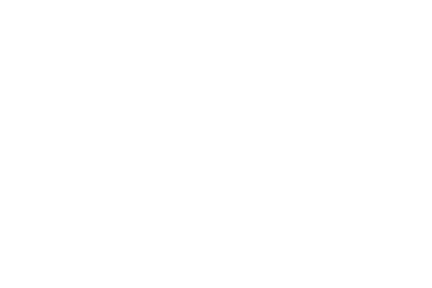

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial2.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


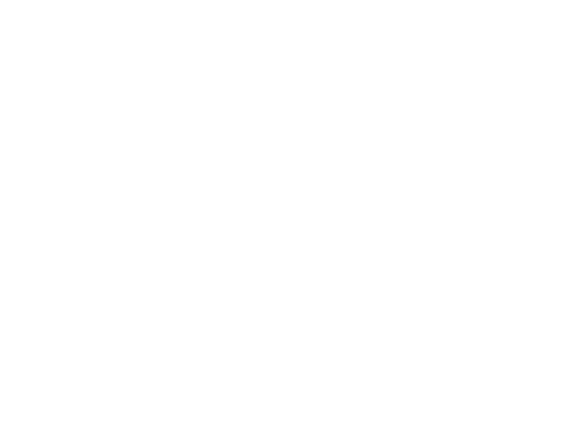

<IPython.core.display.Javascript object>


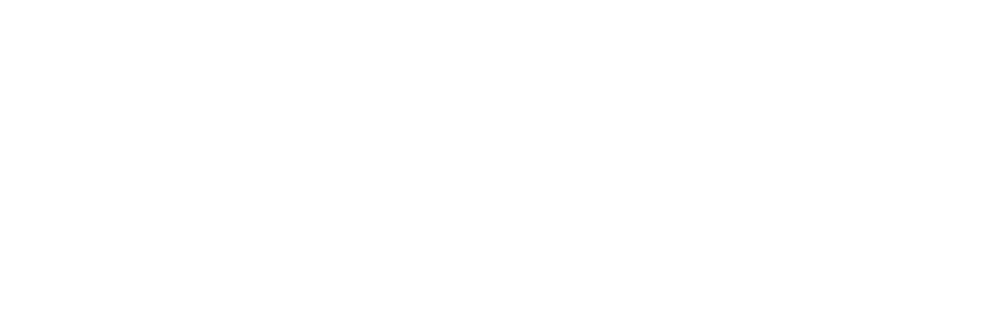

<IPython.core.display.Javascript object>


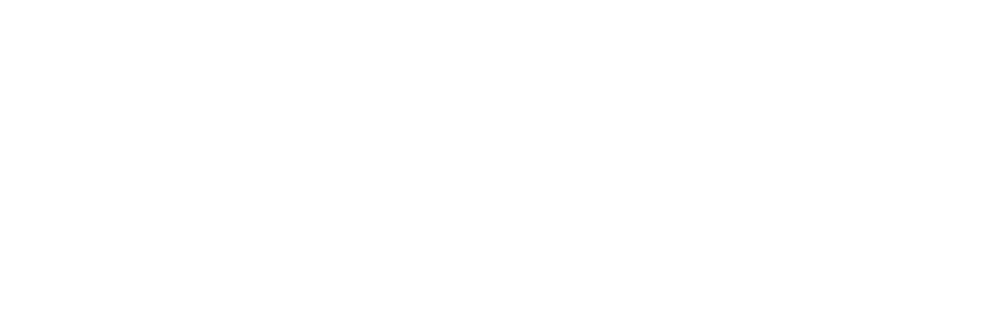

<IPython.core.display.Javascript object>


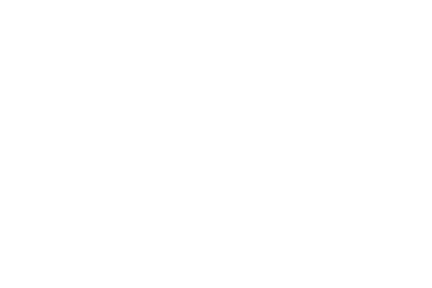

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial3.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


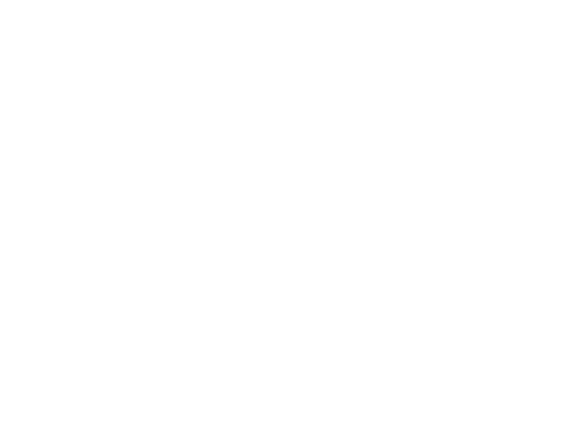

<IPython.core.display.Javascript object>


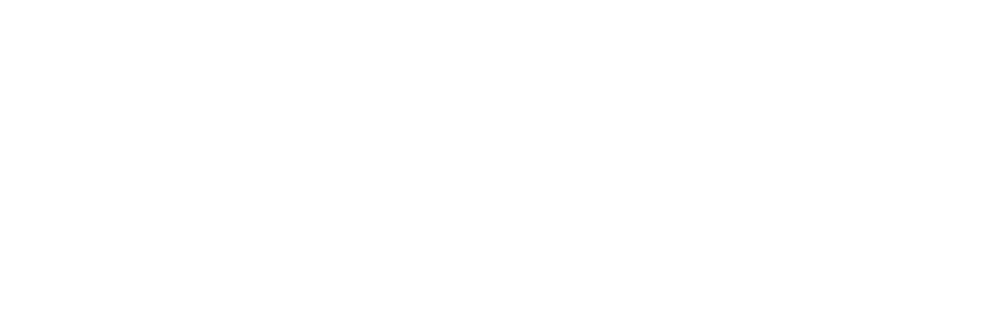

<IPython.core.display.Javascript object>


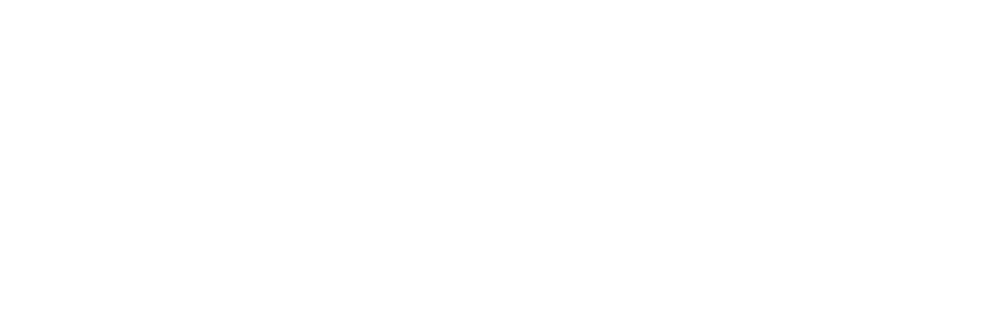

<IPython.core.display.Javascript object>


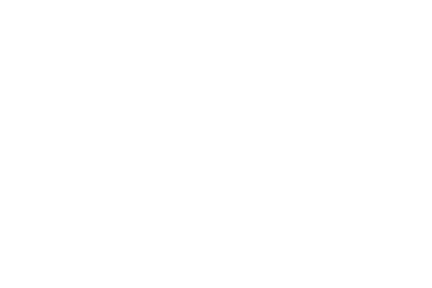

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial4.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


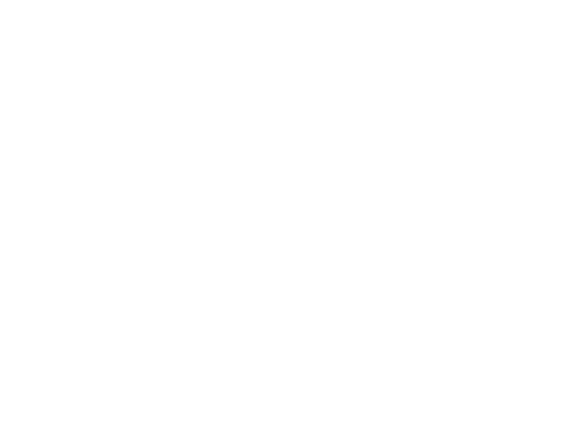

<IPython.core.display.Javascript object>


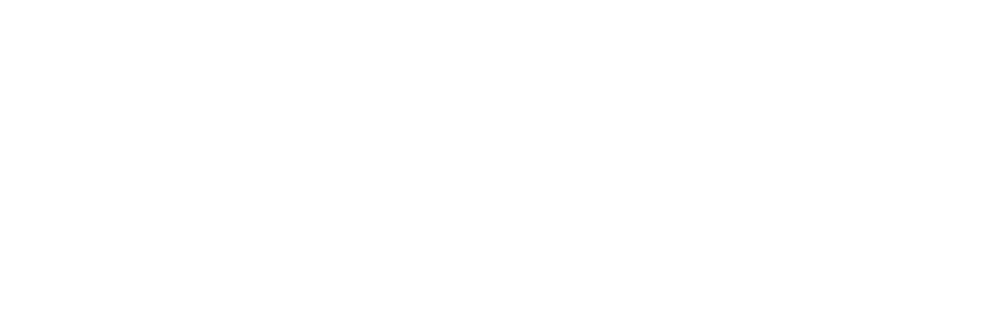

<IPython.core.display.Javascript object>


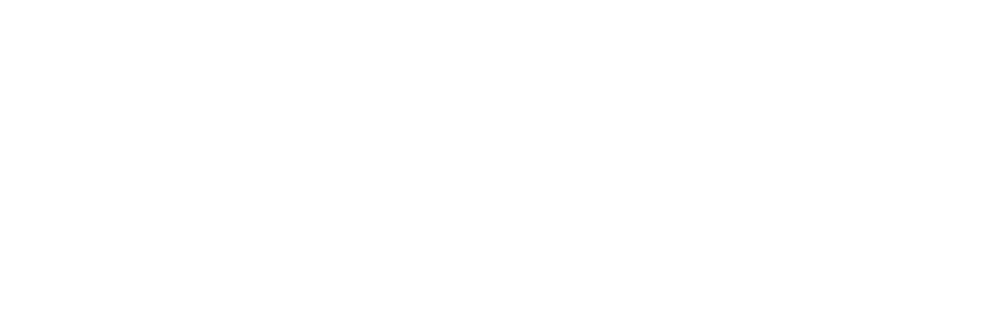

<IPython.core.display.Javascript object>


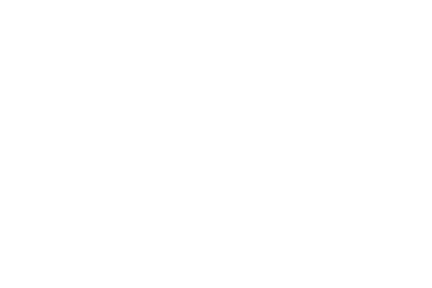

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


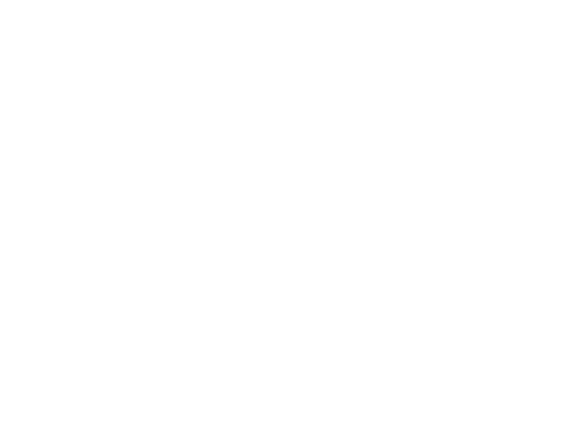

<IPython.core.display.Javascript object>


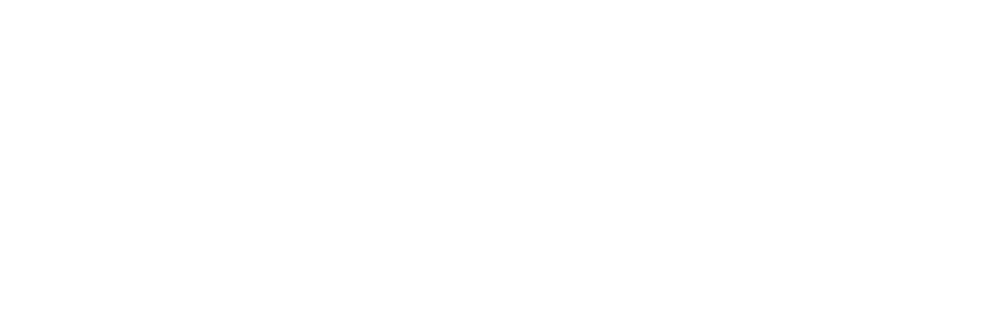

<IPython.core.display.Javascript object>


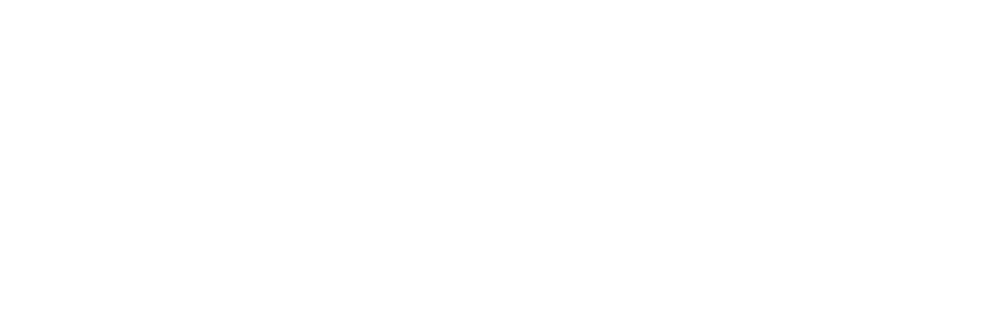

<IPython.core.display.Javascript object>


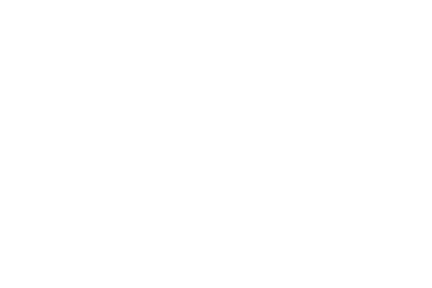

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial6.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


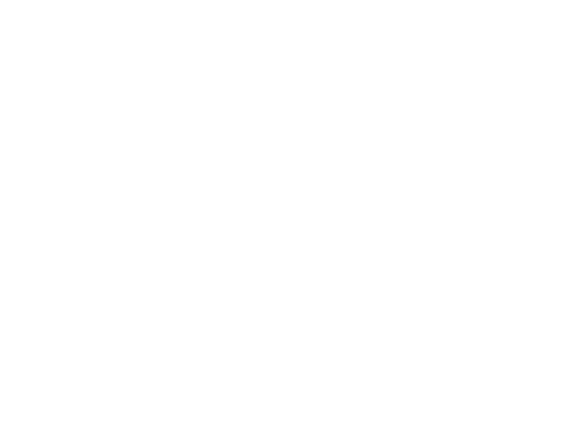

<IPython.core.display.Javascript object>


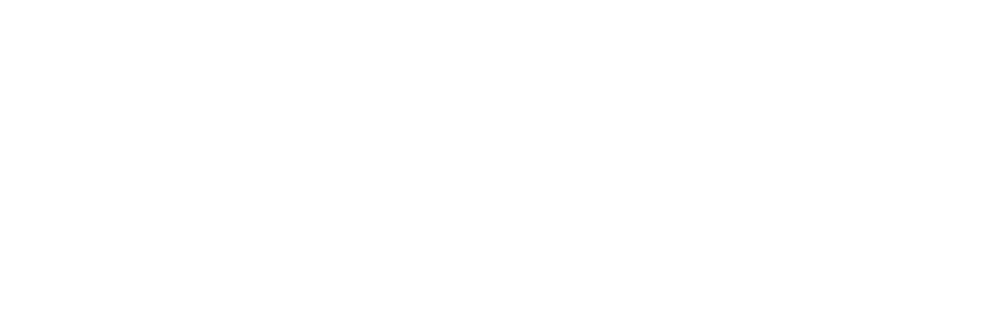

<IPython.core.display.Javascript object>


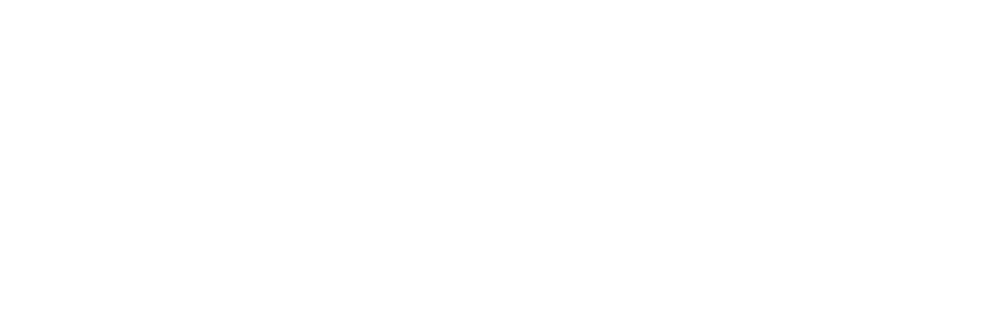

<IPython.core.display.Javascript object>


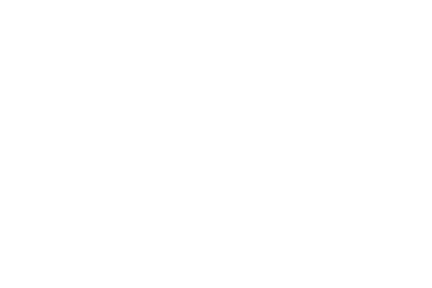

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


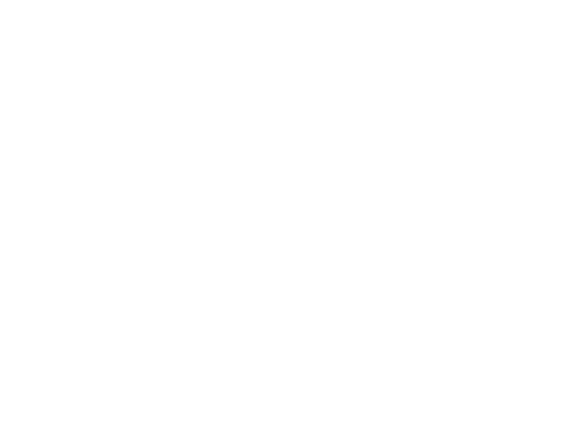

<IPython.core.display.Javascript object>


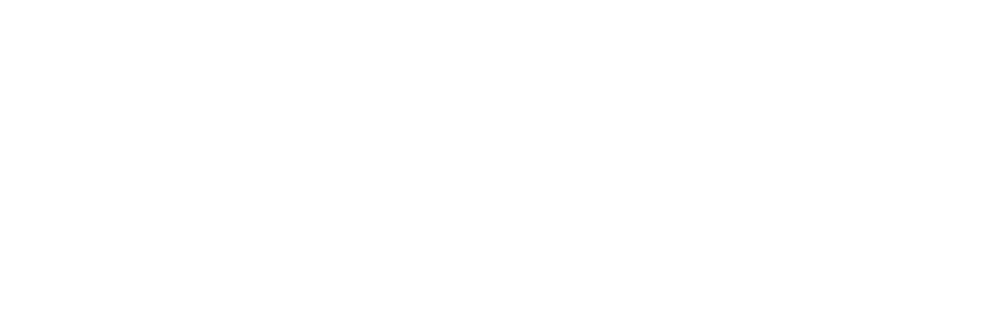

<IPython.core.display.Javascript object>


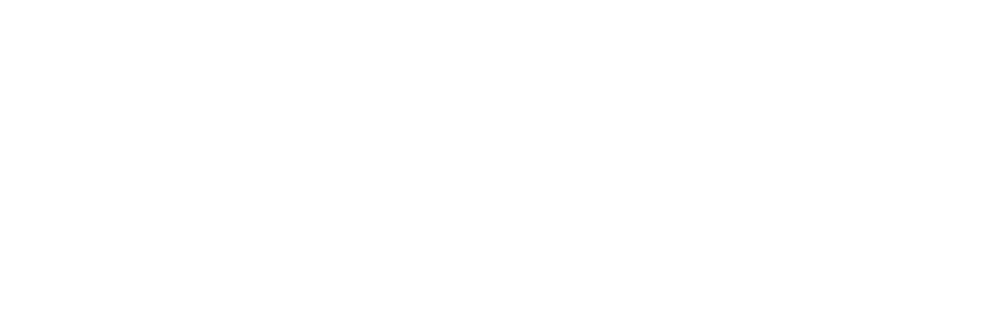

<IPython.core.display.Javascript object>


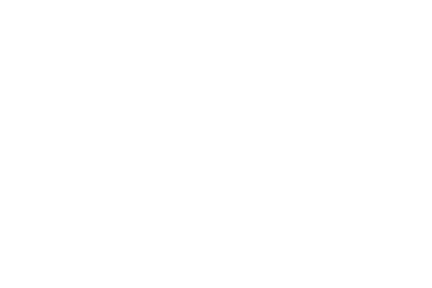

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


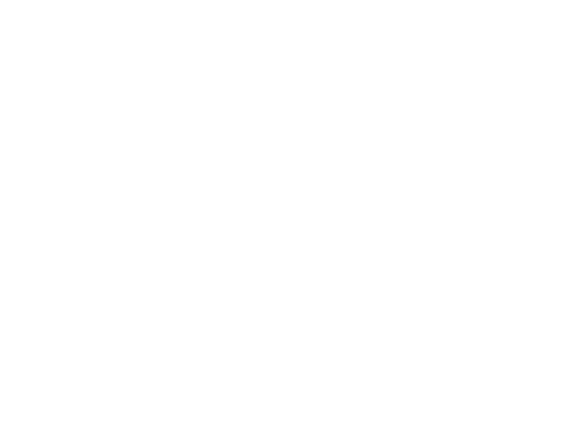

<IPython.core.display.Javascript object>


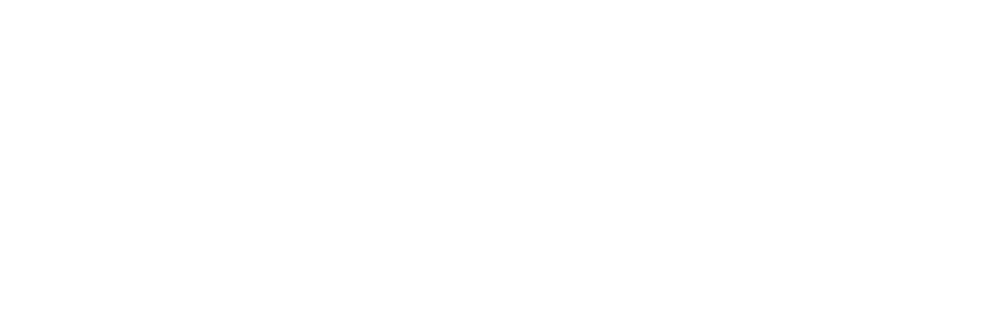

<IPython.core.display.Javascript object>


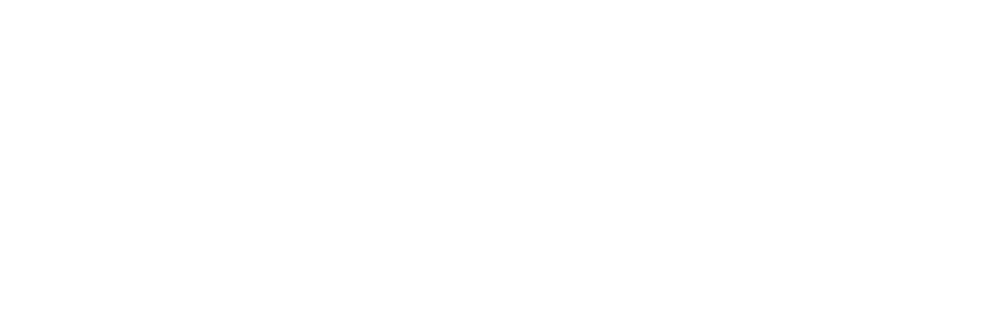

<IPython.core.display.Javascript object>


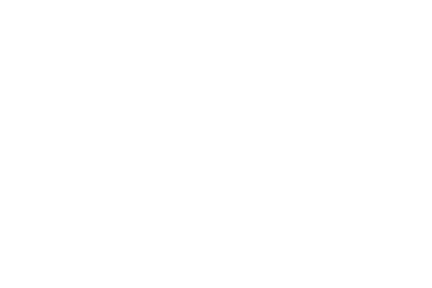

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial9.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


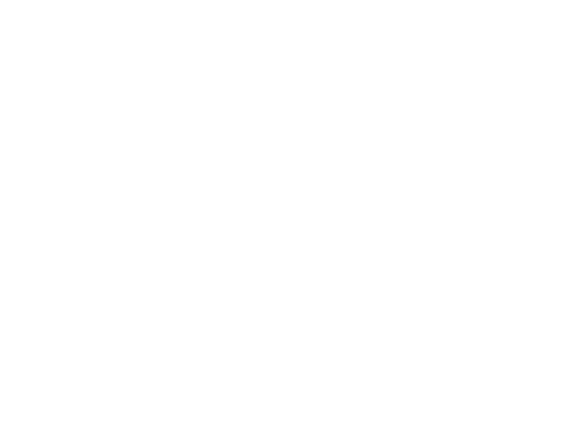

<IPython.core.display.Javascript object>


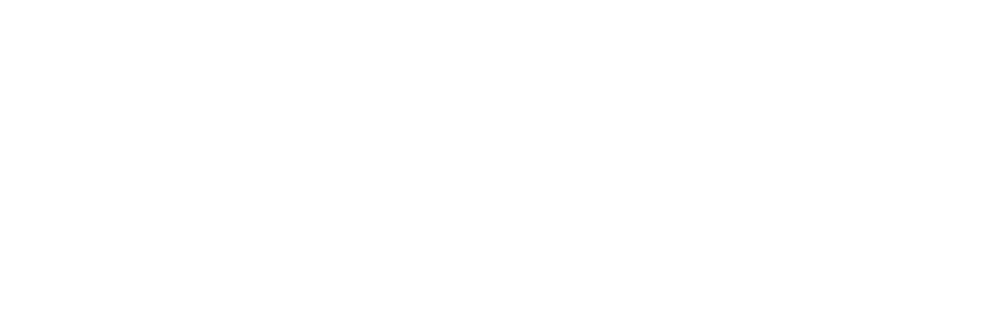

<IPython.core.display.Javascript object>


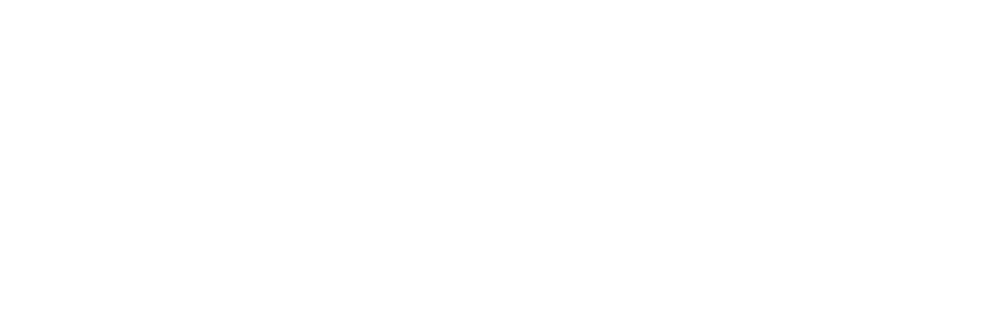

<IPython.core.display.Javascript object>


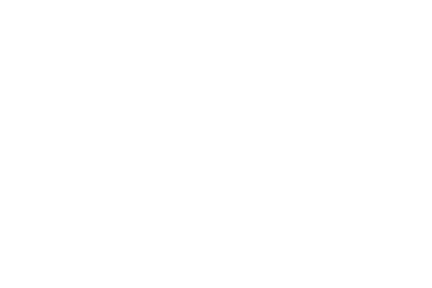

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial10.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


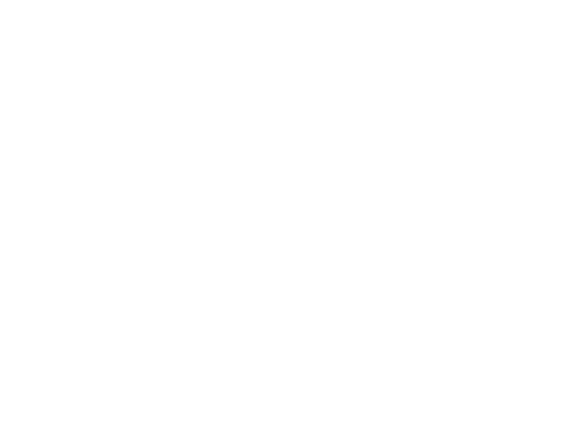

<IPython.core.display.Javascript object>


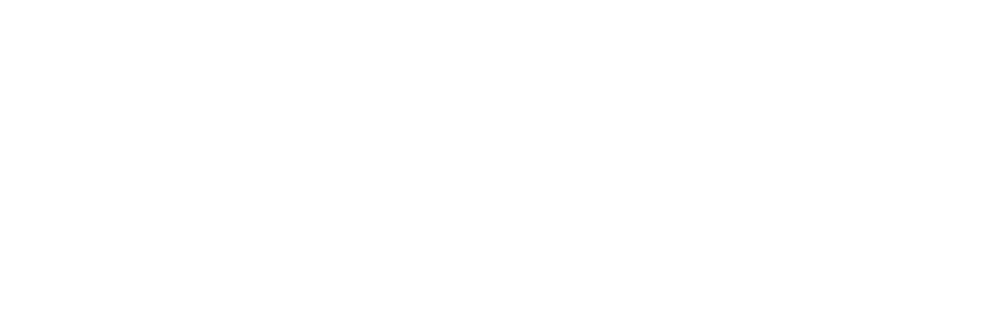

<IPython.core.display.Javascript object>


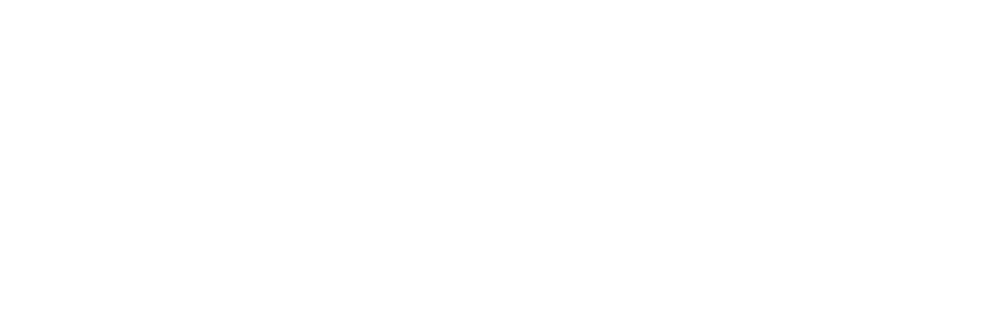

<IPython.core.display.Javascript object>


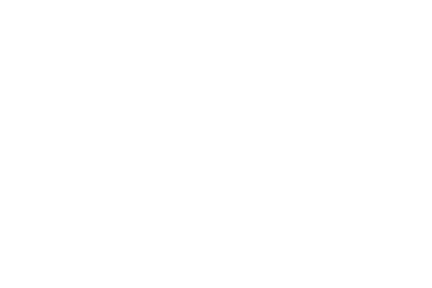

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial11.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


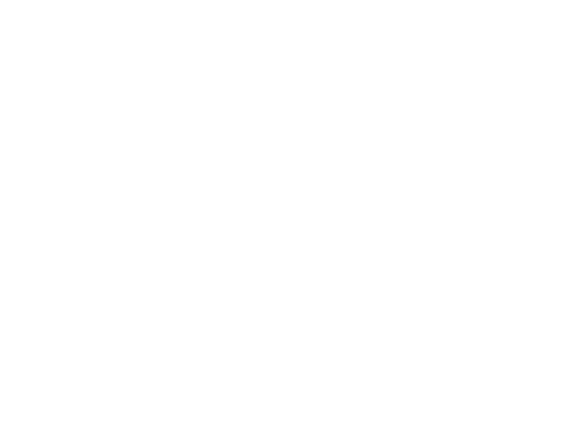

<IPython.core.display.Javascript object>


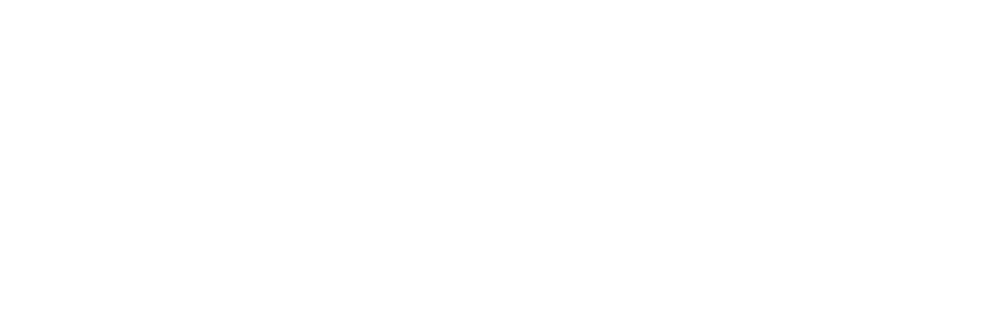

<IPython.core.display.Javascript object>


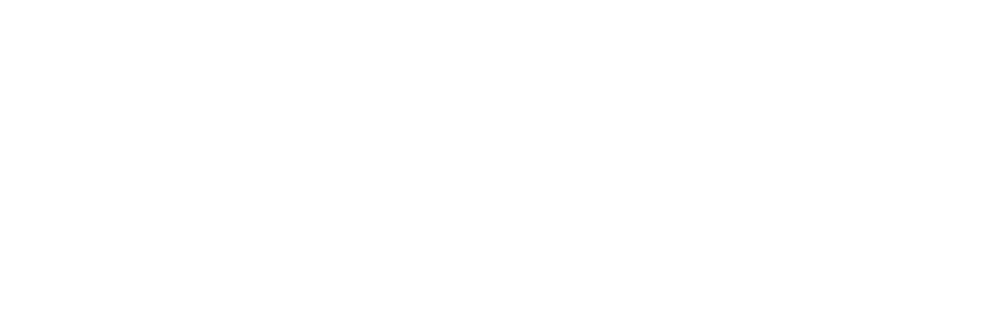

<IPython.core.display.Javascript object>


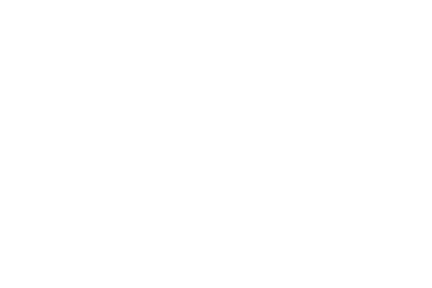

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial12.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


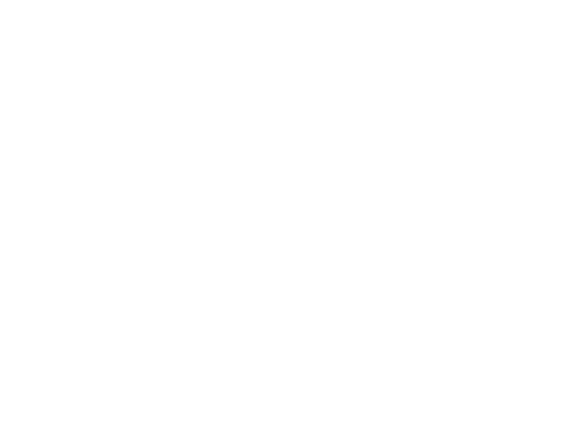

<IPython.core.display.Javascript object>


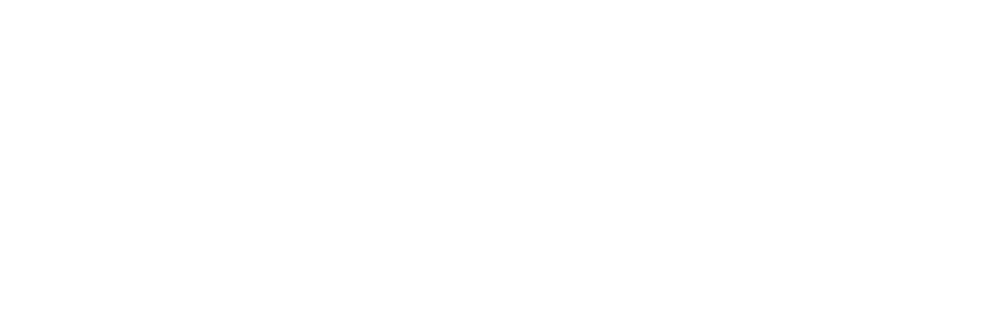

<IPython.core.display.Javascript object>


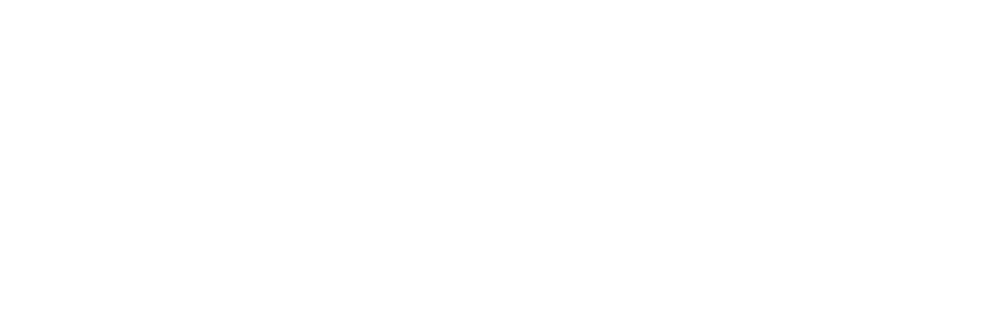

<IPython.core.display.Javascript object>


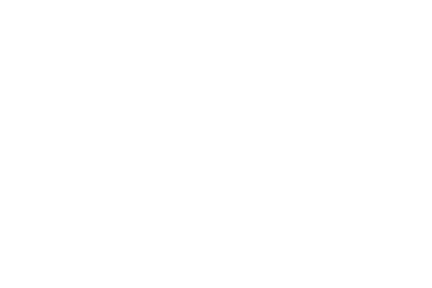

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial13.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


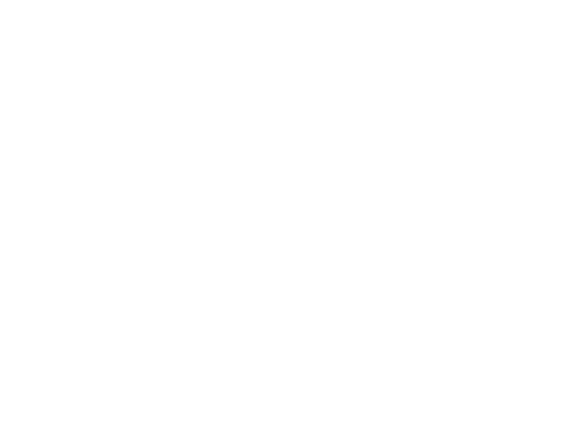

<IPython.core.display.Javascript object>


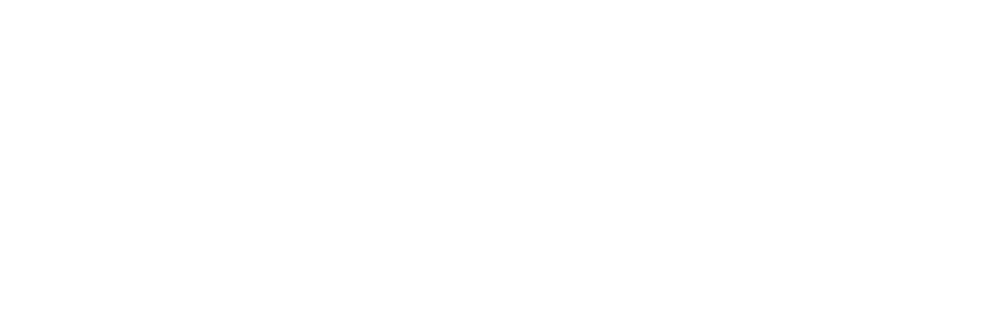

<IPython.core.display.Javascript object>


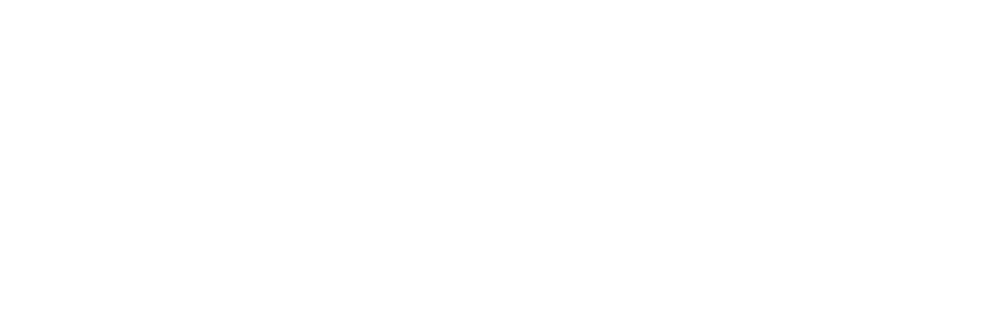

<IPython.core.display.Javascript object>


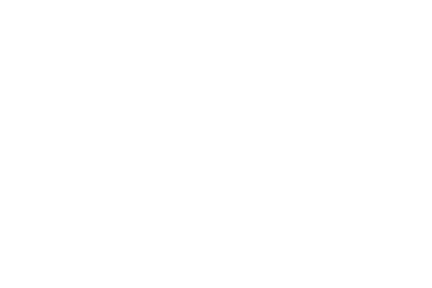

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial14.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


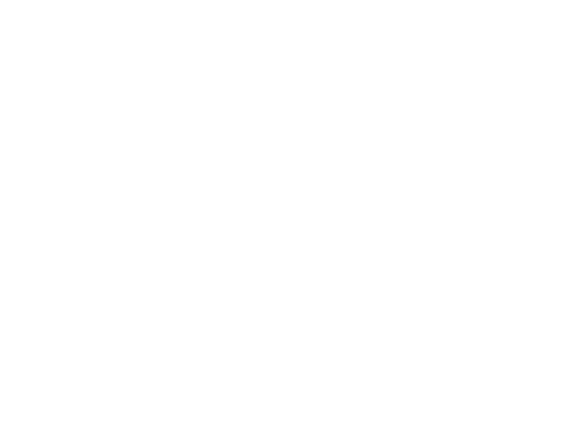

<IPython.core.display.Javascript object>


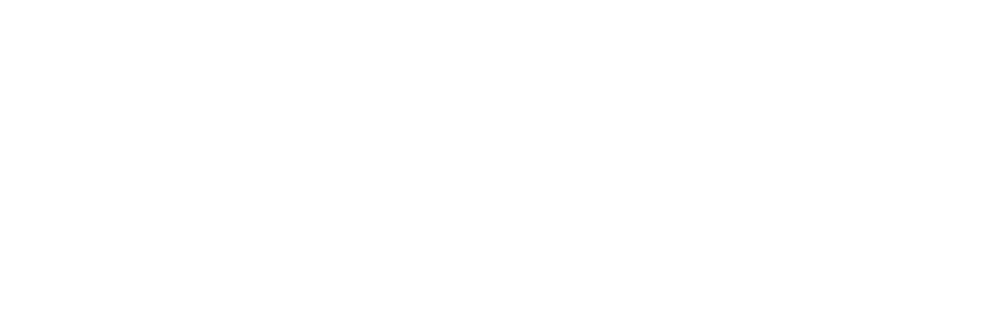

<IPython.core.display.Javascript object>


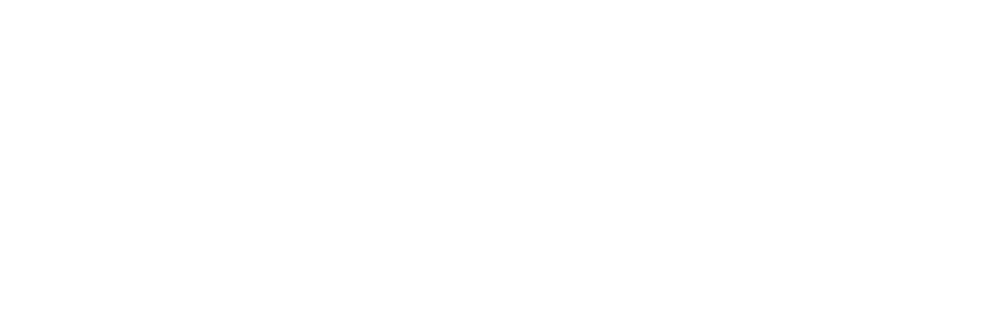

<IPython.core.display.Javascript object>


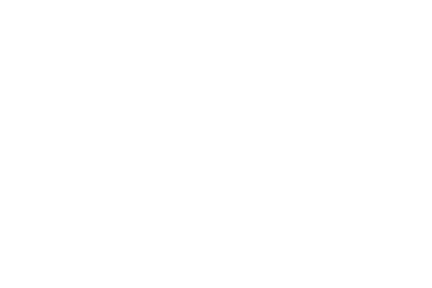

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906\20180906_Trial15.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180906 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


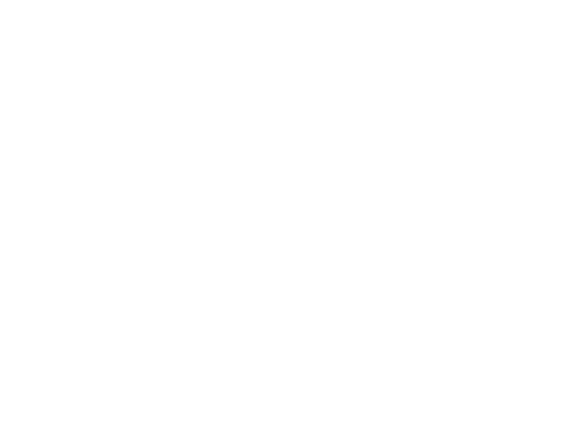

<IPython.core.display.Javascript object>


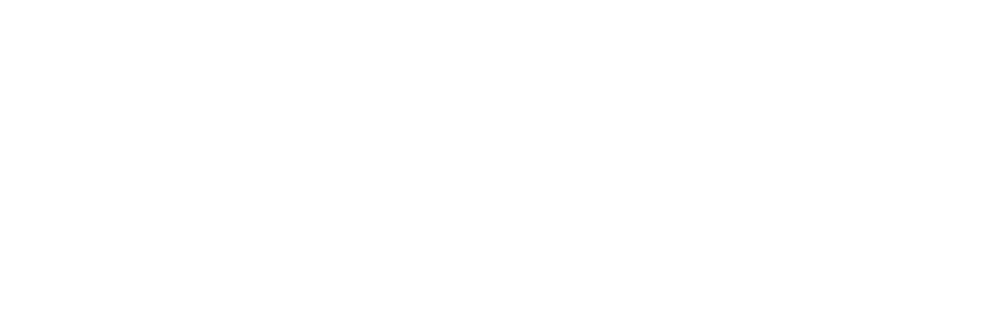

<IPython.core.display.Javascript object>


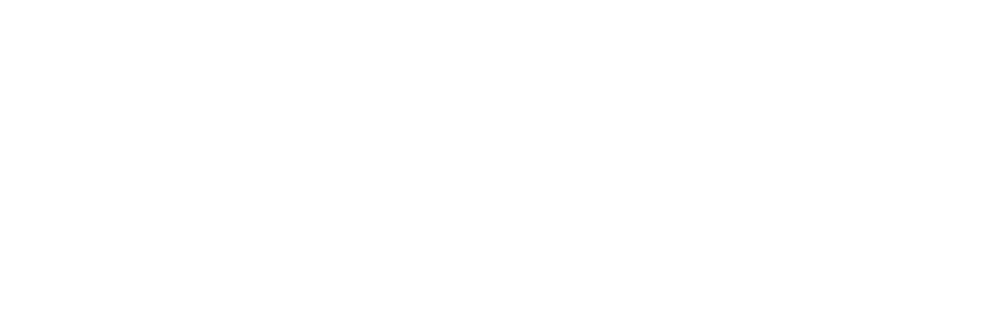

<IPython.core.display.Javascript object>


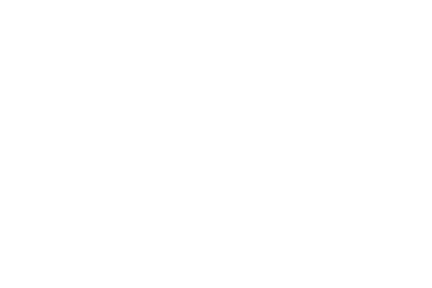

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial1.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


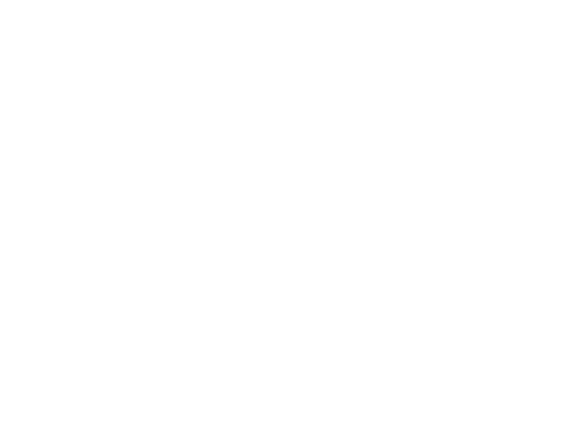

<IPython.core.display.Javascript object>


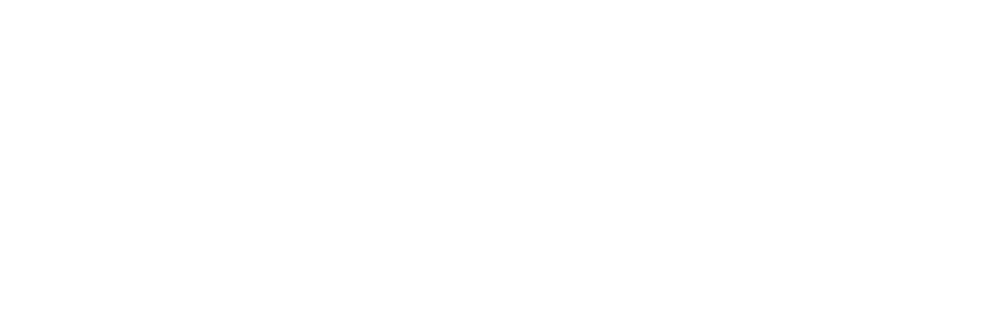

<IPython.core.display.Javascript object>


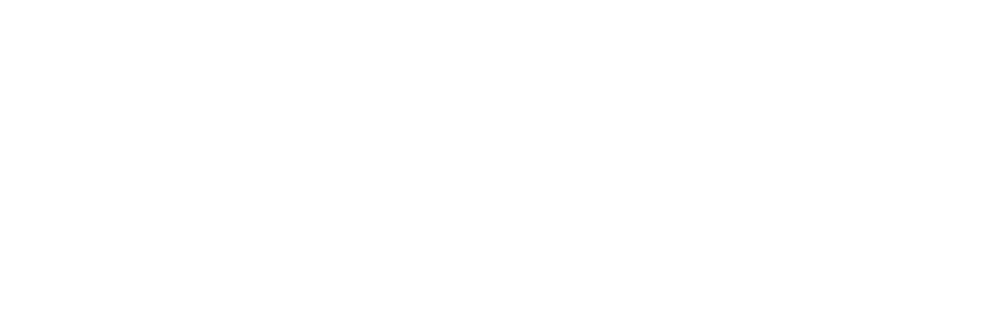

<IPython.core.display.Javascript object>


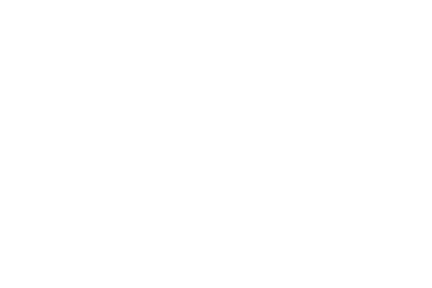

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial2.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


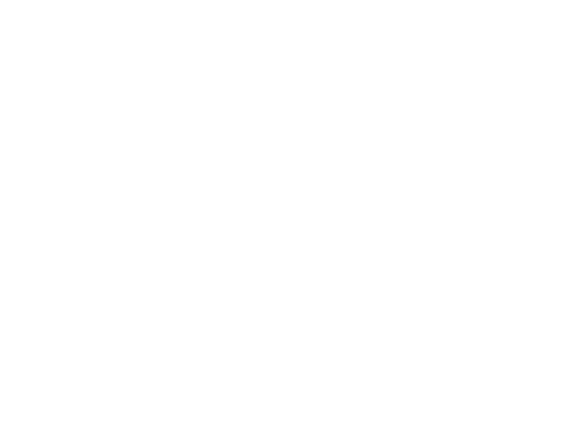

<IPython.core.display.Javascript object>


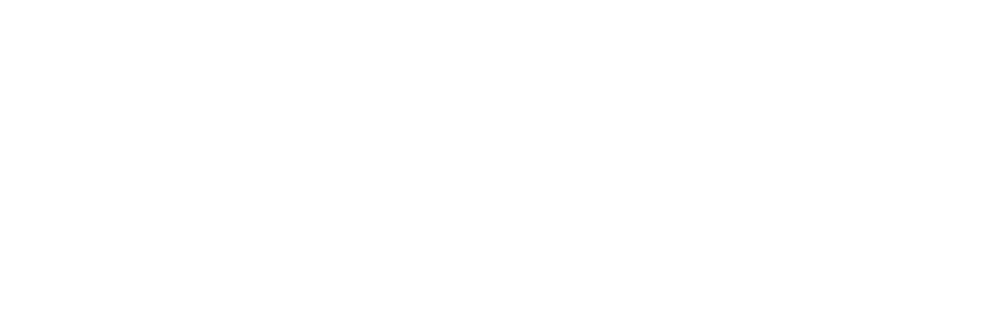

<IPython.core.display.Javascript object>


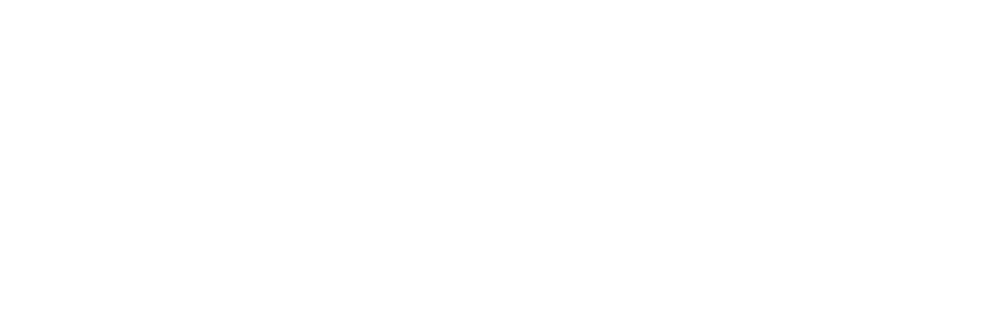

<IPython.core.display.Javascript object>


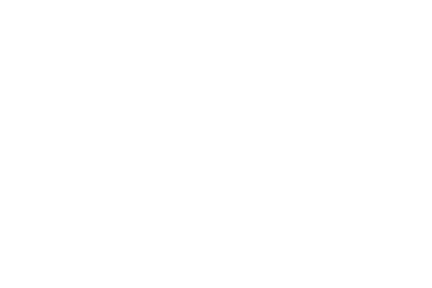

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial3.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


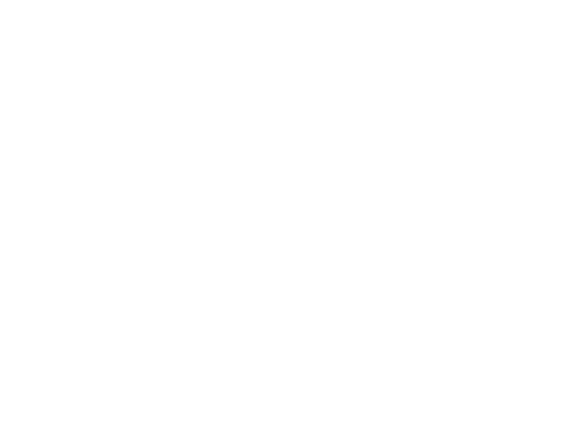

<IPython.core.display.Javascript object>


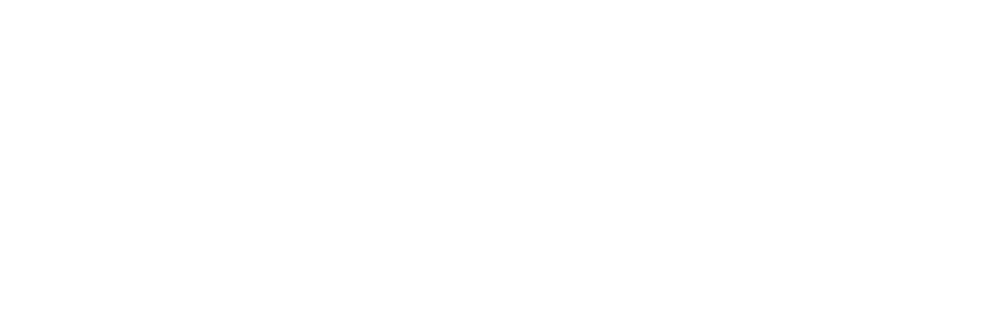

<IPython.core.display.Javascript object>


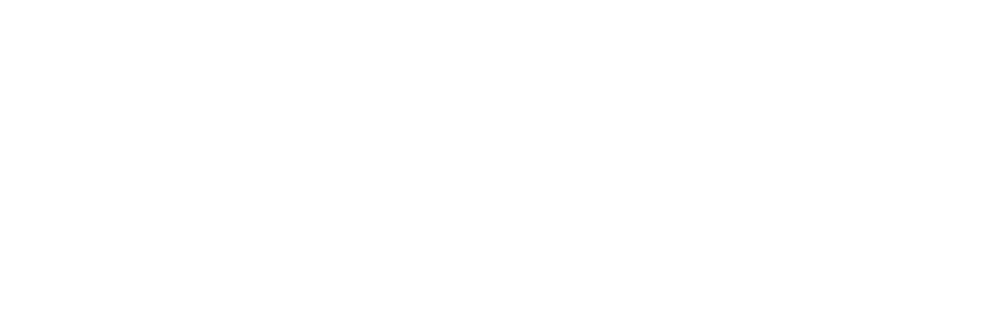

<IPython.core.display.Javascript object>


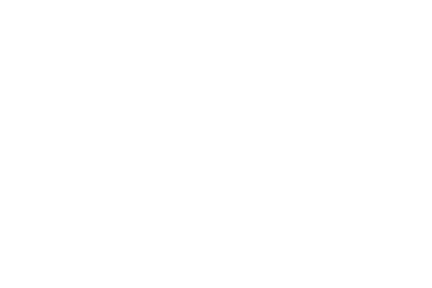

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial4.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


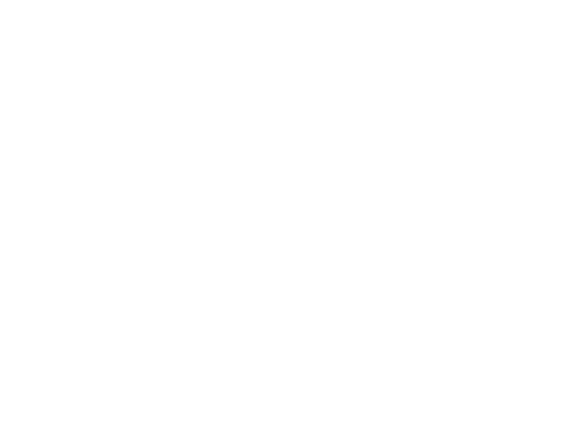

<IPython.core.display.Javascript object>


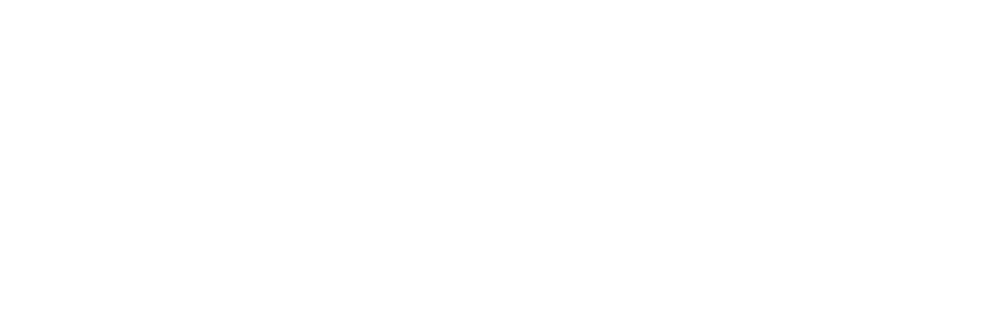

<IPython.core.display.Javascript object>


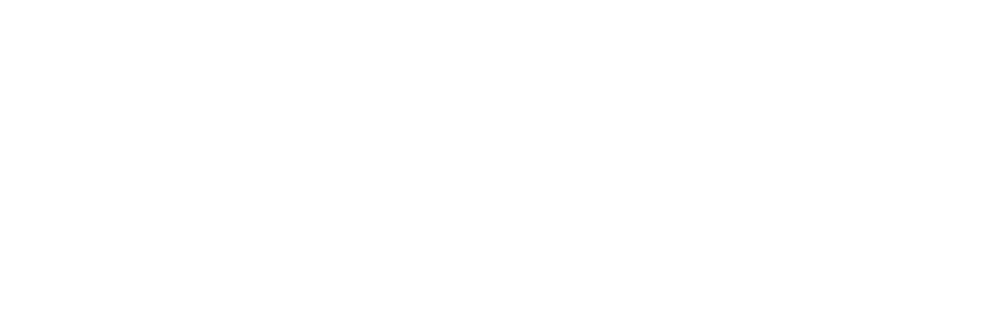

<IPython.core.display.Javascript object>


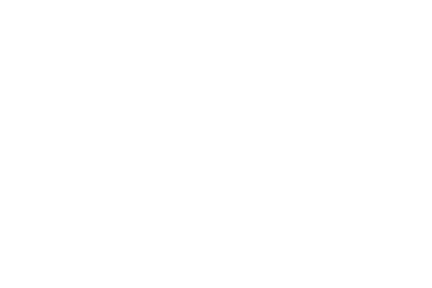

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


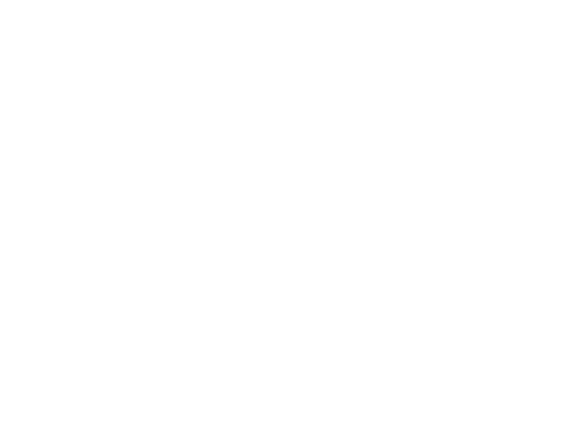

<IPython.core.display.Javascript object>


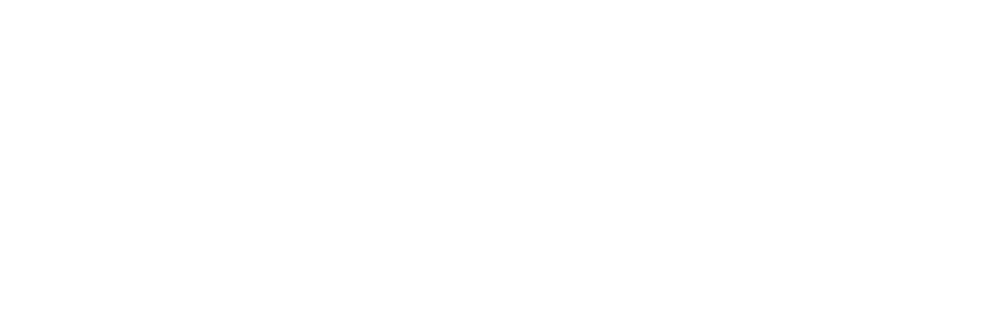

<IPython.core.display.Javascript object>


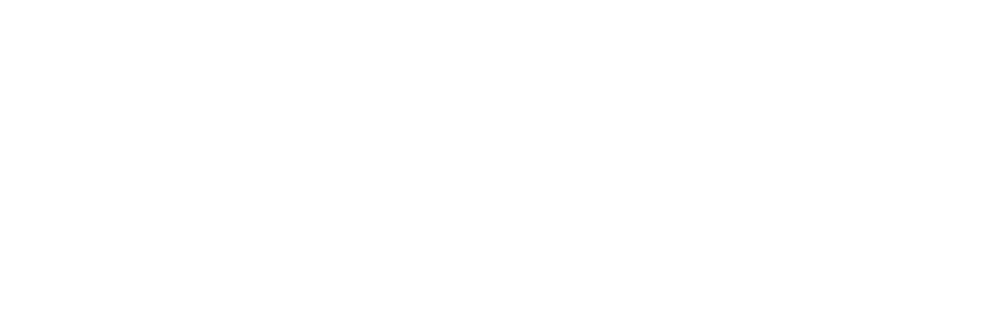

<IPython.core.display.Javascript object>


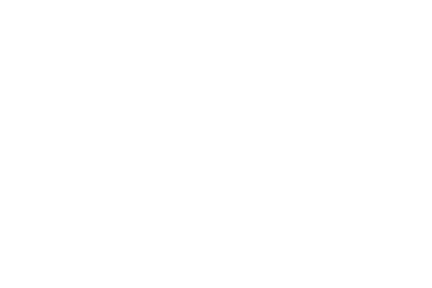

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial6.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


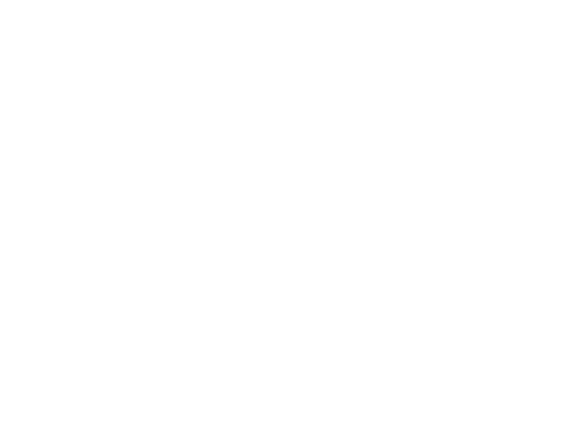

<IPython.core.display.Javascript object>


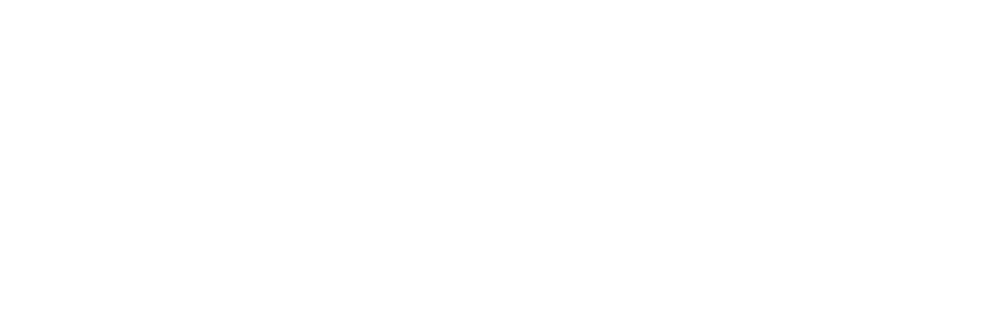

<IPython.core.display.Javascript object>


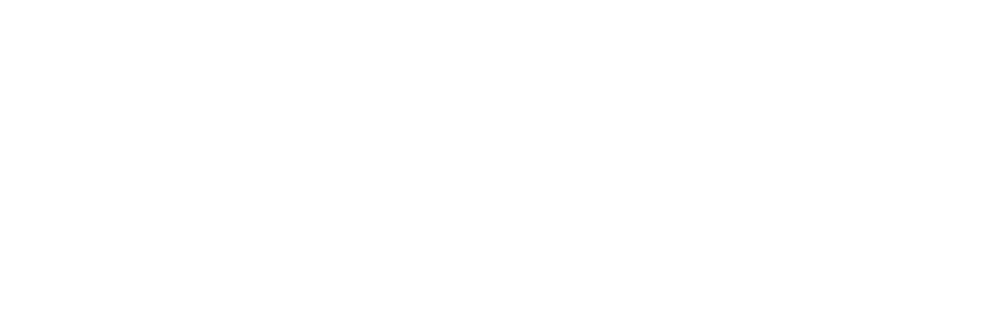

<IPython.core.display.Javascript object>


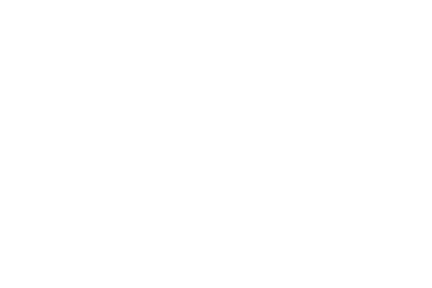

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


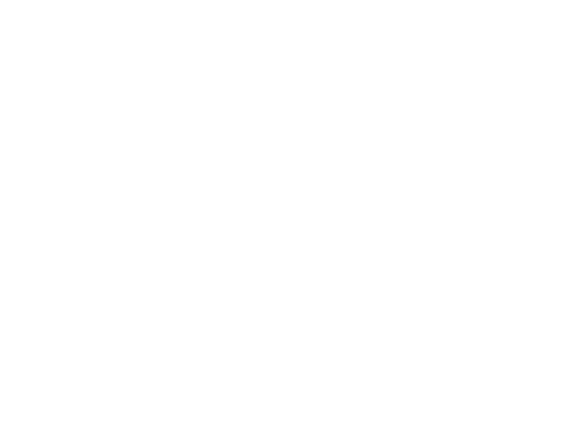

<IPython.core.display.Javascript object>


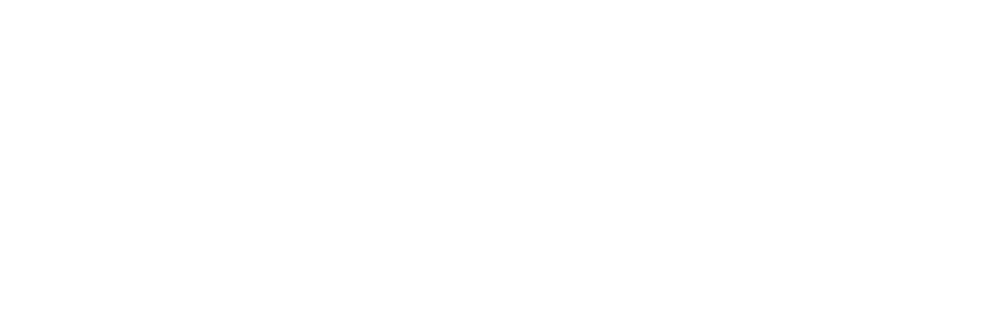

<IPython.core.display.Javascript object>


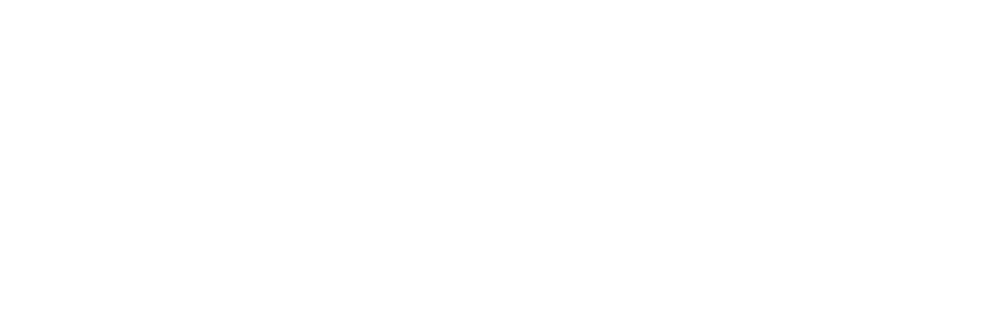

<IPython.core.display.Javascript object>


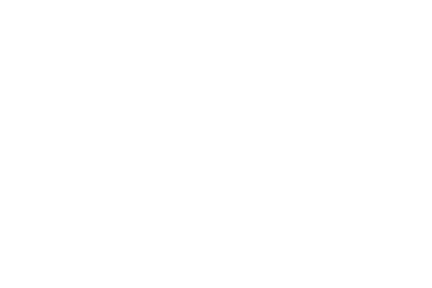

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


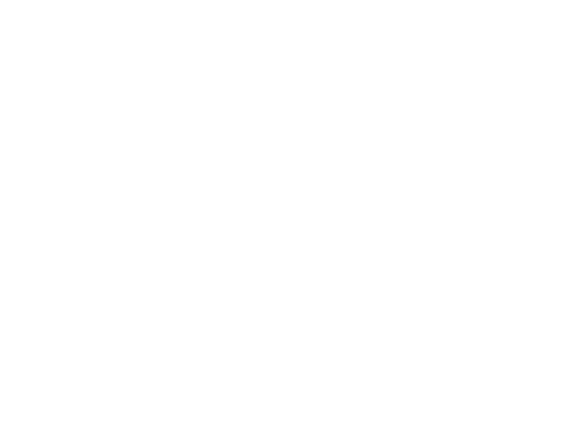

<IPython.core.display.Javascript object>


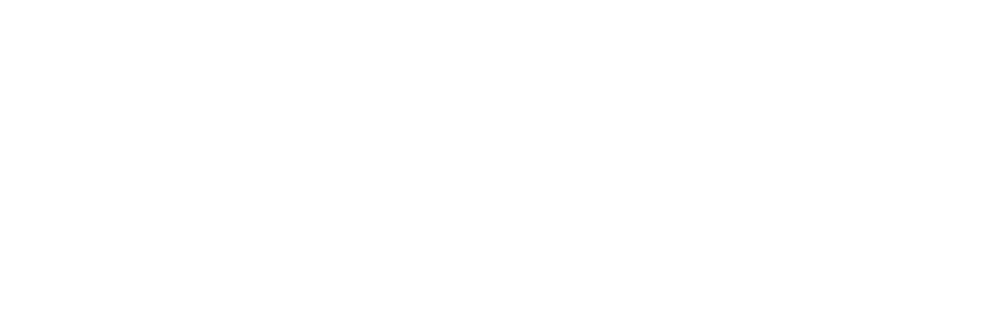

<IPython.core.display.Javascript object>


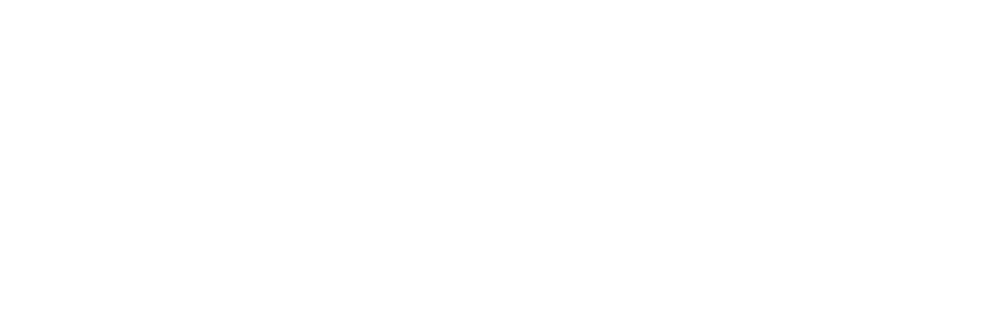

<IPython.core.display.Javascript object>


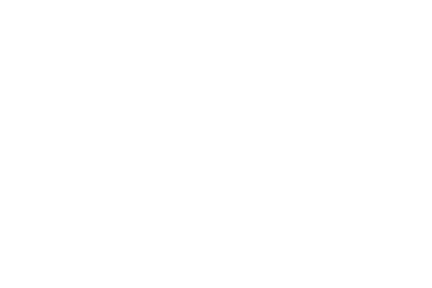

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial9.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


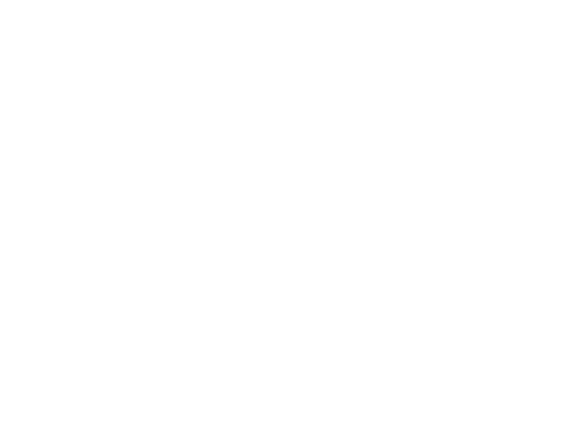

<IPython.core.display.Javascript object>


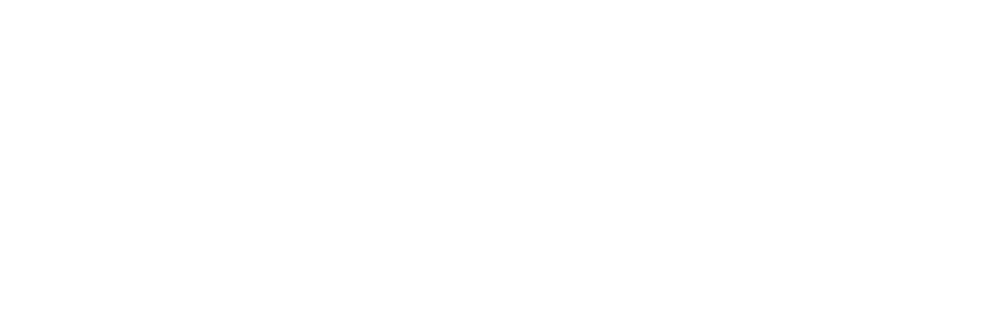

<IPython.core.display.Javascript object>


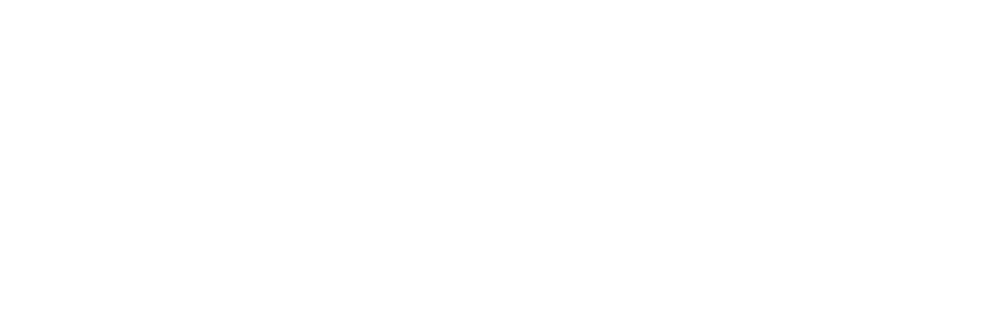

<IPython.core.display.Javascript object>


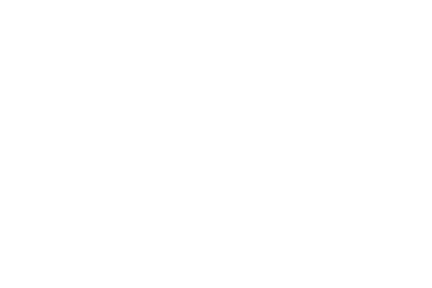

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial10.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


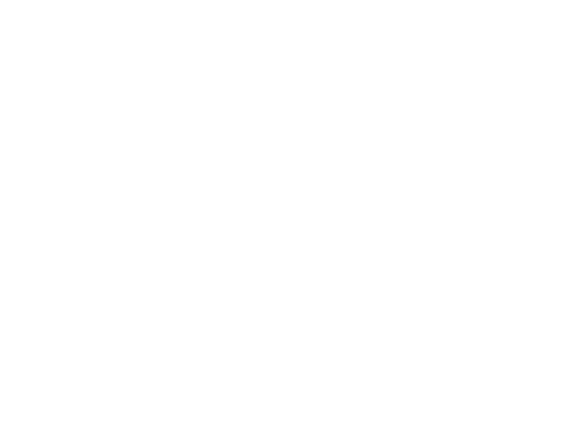

<IPython.core.display.Javascript object>


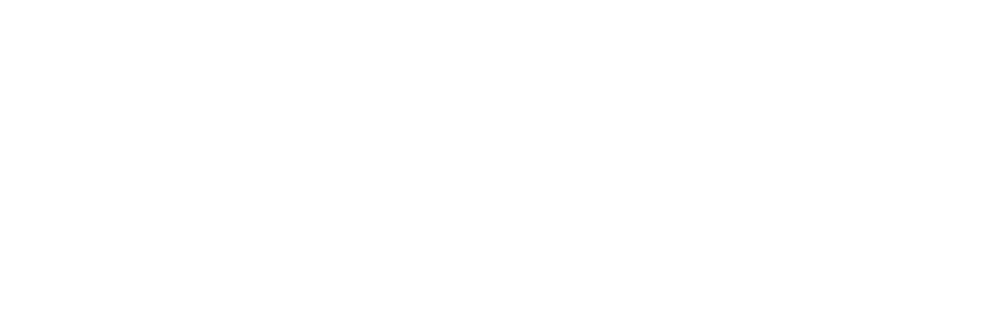

<IPython.core.display.Javascript object>


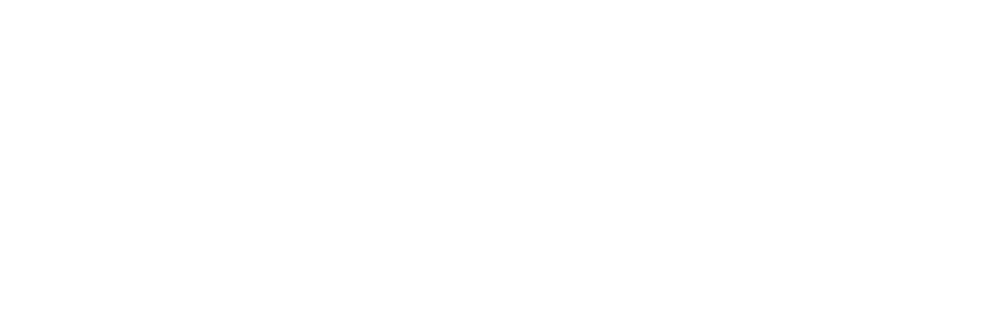

<IPython.core.display.Javascript object>


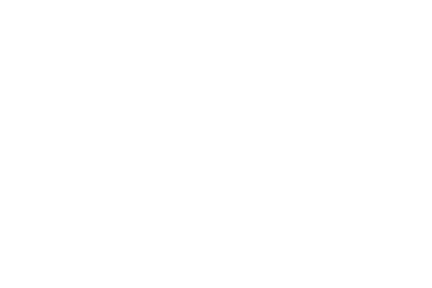

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial11.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


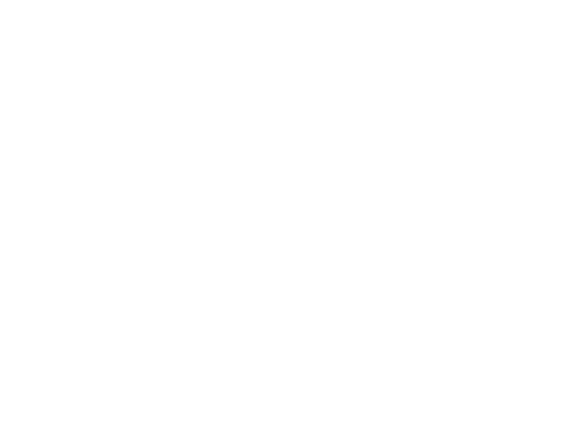

<IPython.core.display.Javascript object>


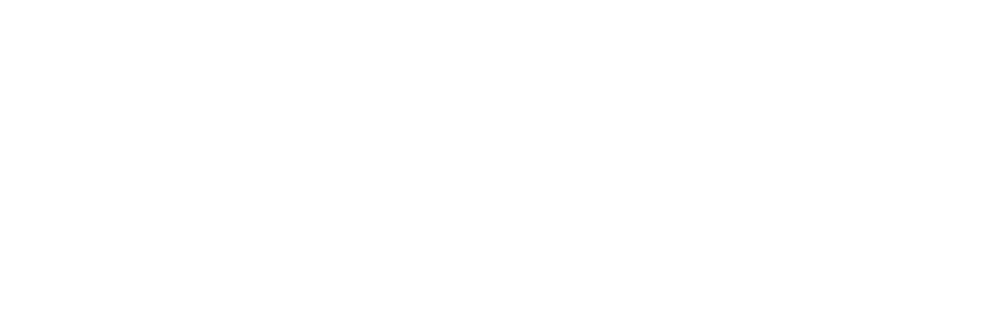

<IPython.core.display.Javascript object>


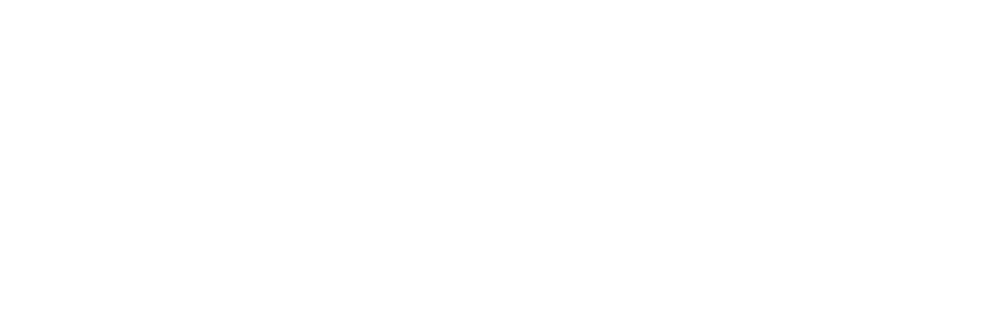

<IPython.core.display.Javascript object>


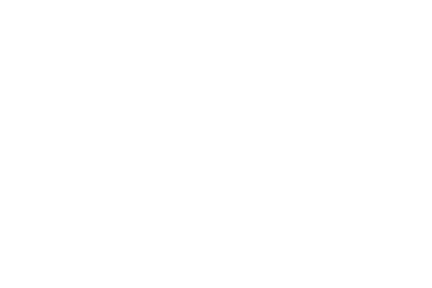

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial12.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


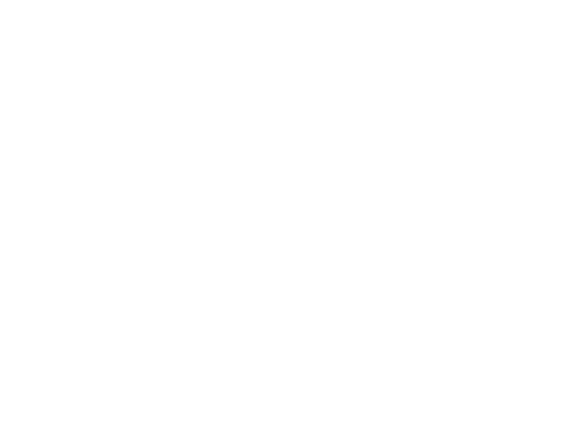

<IPython.core.display.Javascript object>


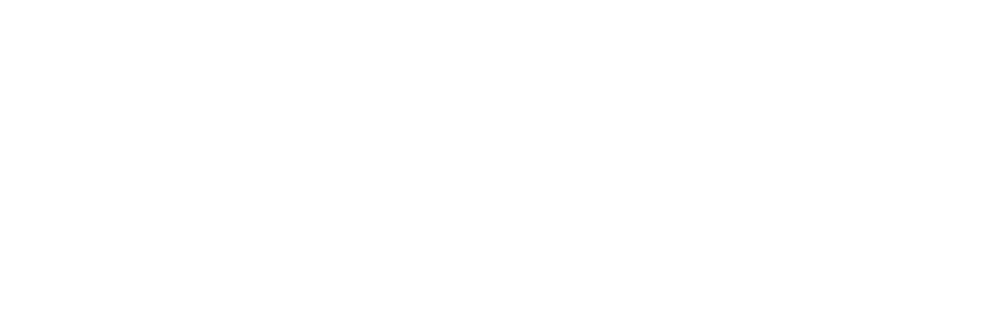

<IPython.core.display.Javascript object>


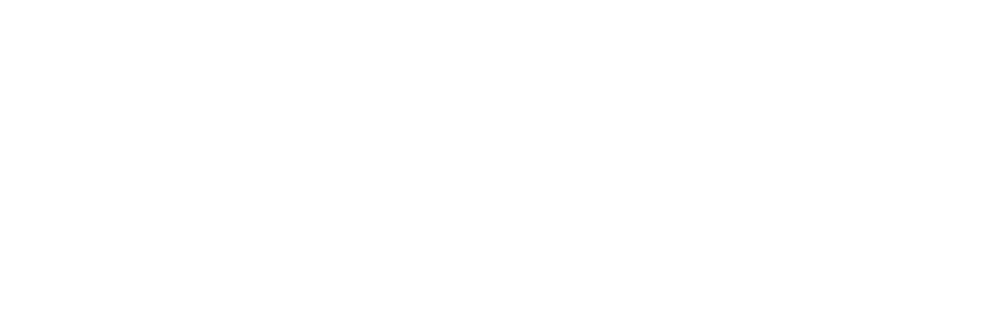

<IPython.core.display.Javascript object>


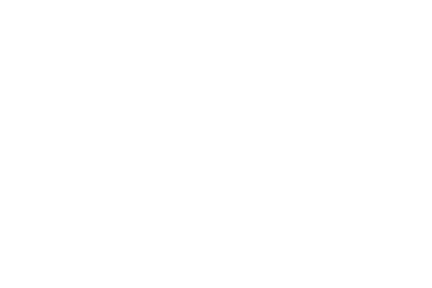

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial13.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


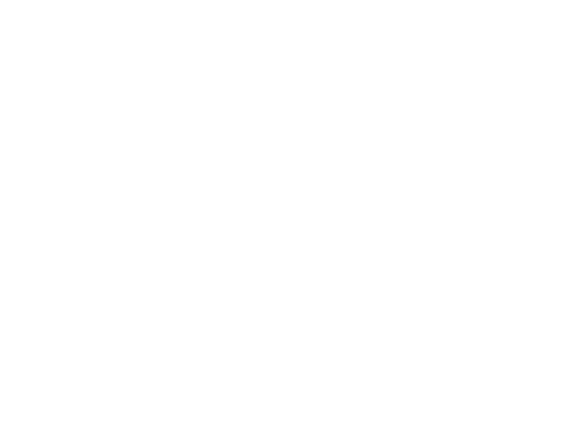

<IPython.core.display.Javascript object>


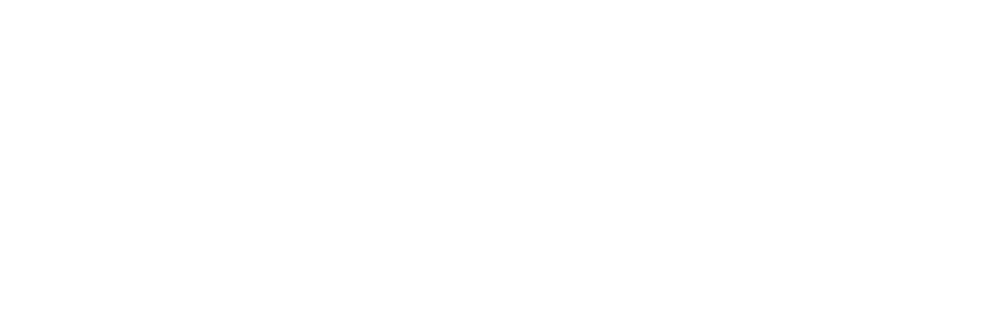

<IPython.core.display.Javascript object>


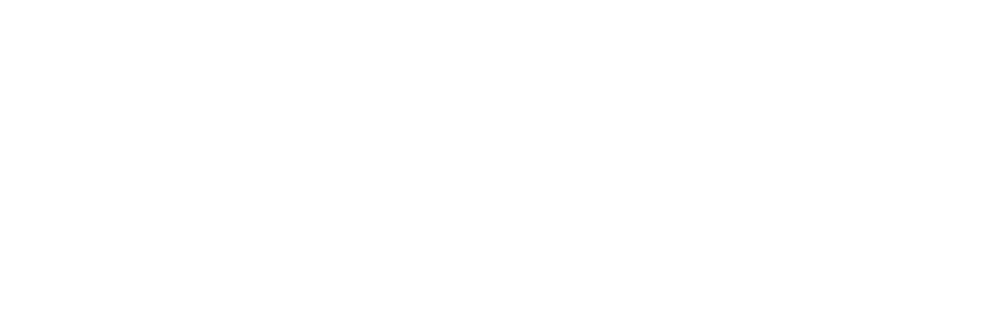

<IPython.core.display.Javascript object>


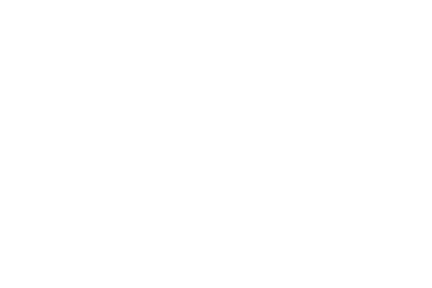

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial14.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


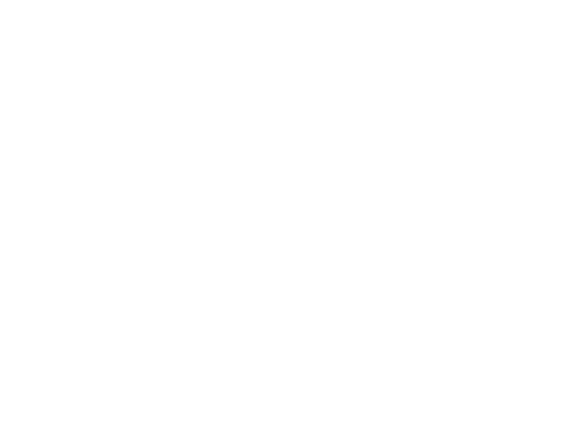

<IPython.core.display.Javascript object>


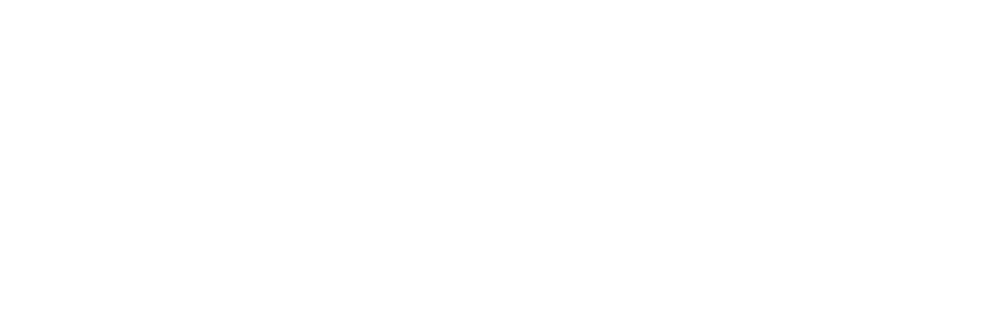

<IPython.core.display.Javascript object>


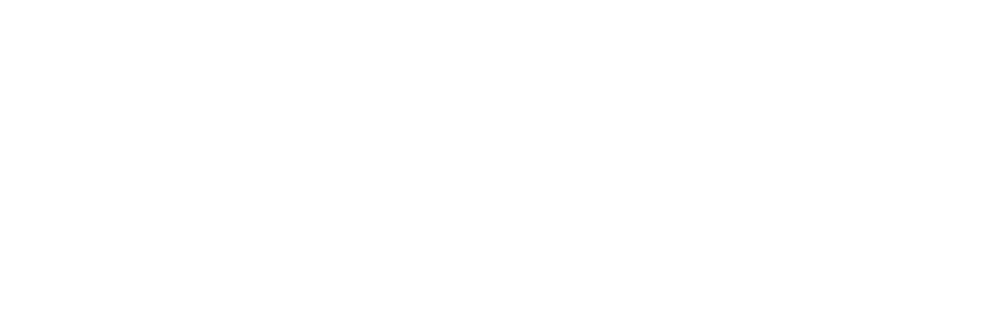

<IPython.core.display.Javascript object>


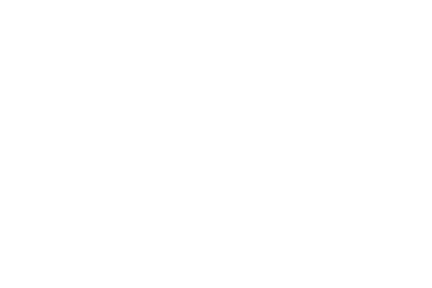

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910\20180910_Trial15.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180910 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


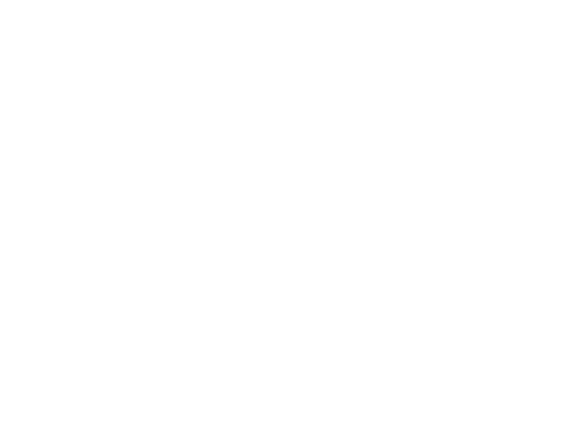

<IPython.core.display.Javascript object>


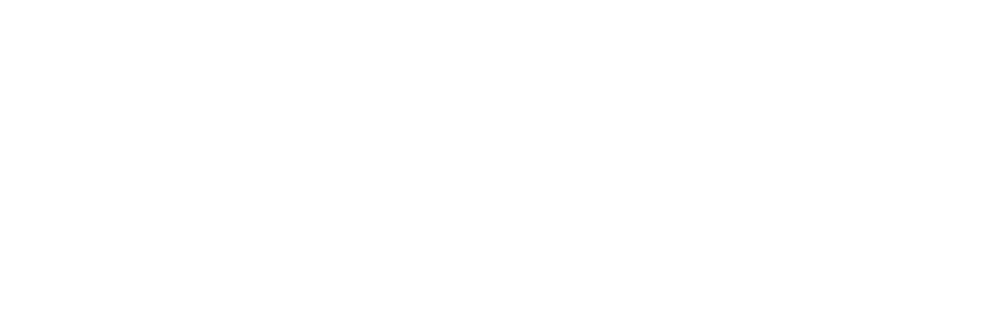

<IPython.core.display.Javascript object>


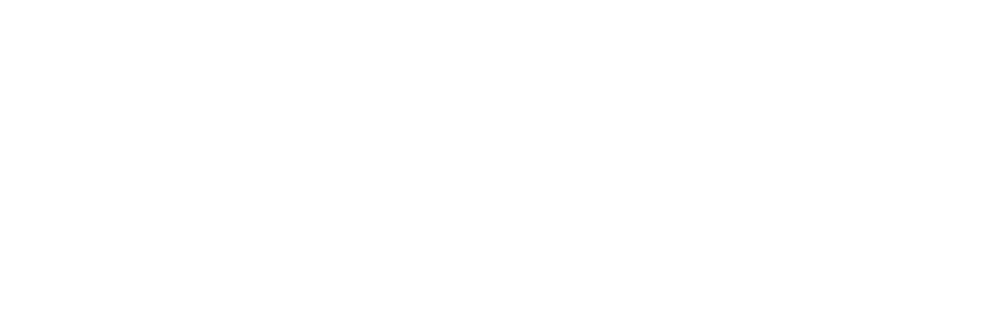

<IPython.core.display.Javascript object>


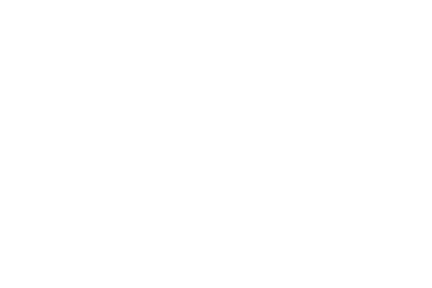

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial1.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


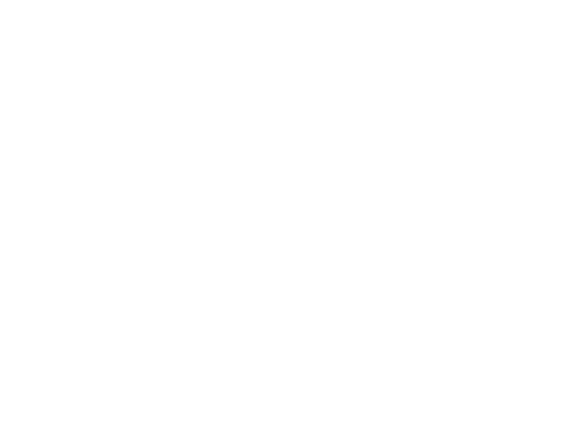

<IPython.core.display.Javascript object>


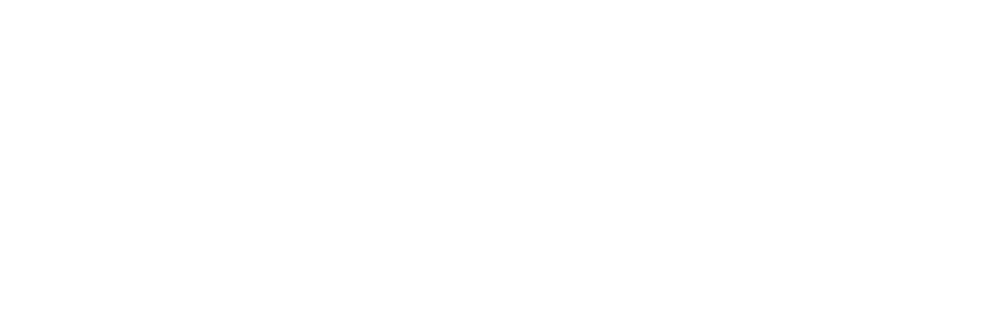

<IPython.core.display.Javascript object>


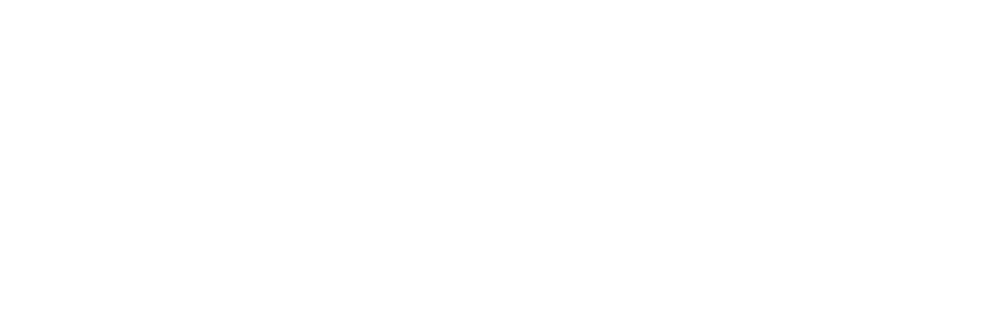

<IPython.core.display.Javascript object>


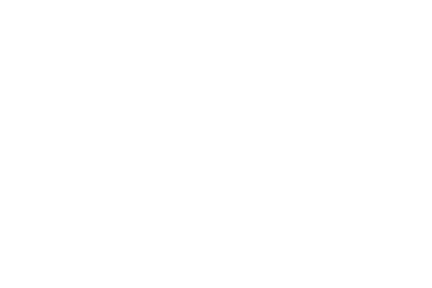

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial2.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


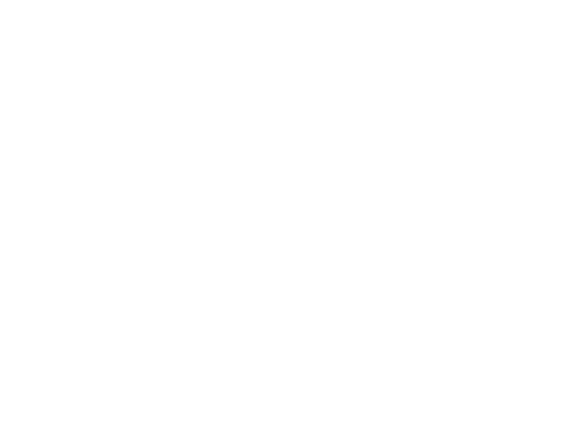

<IPython.core.display.Javascript object>


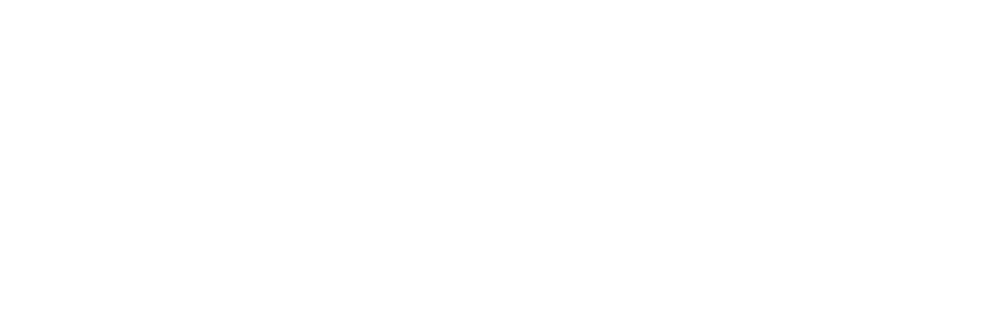

<IPython.core.display.Javascript object>


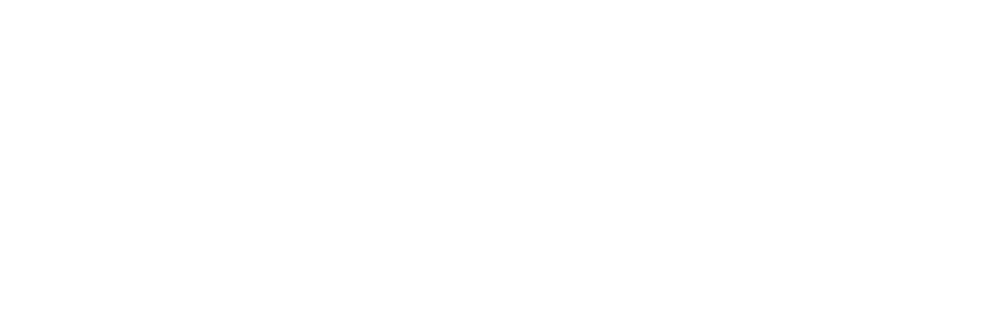

<IPython.core.display.Javascript object>


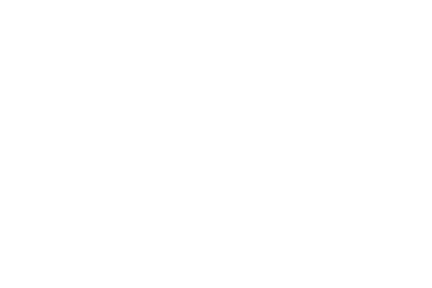

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial3.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


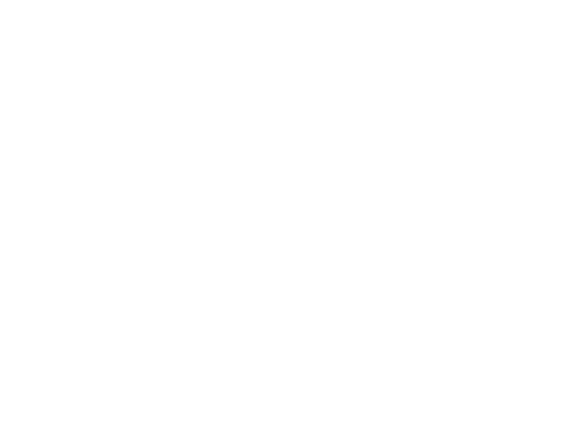

<IPython.core.display.Javascript object>


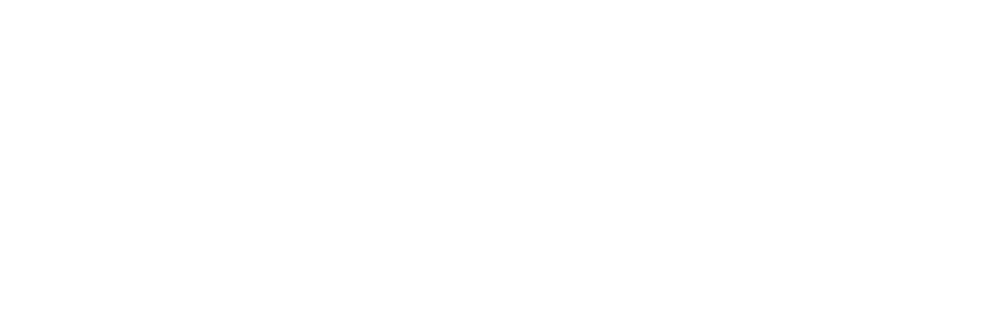

<IPython.core.display.Javascript object>


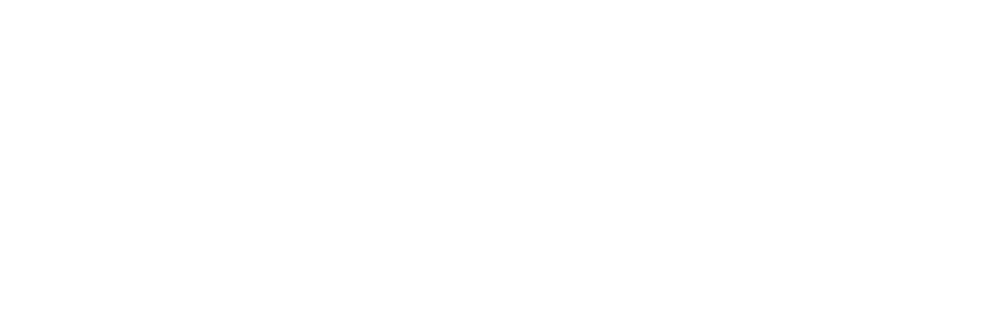

<IPython.core.display.Javascript object>


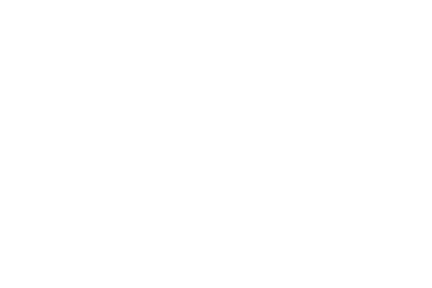

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial4.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


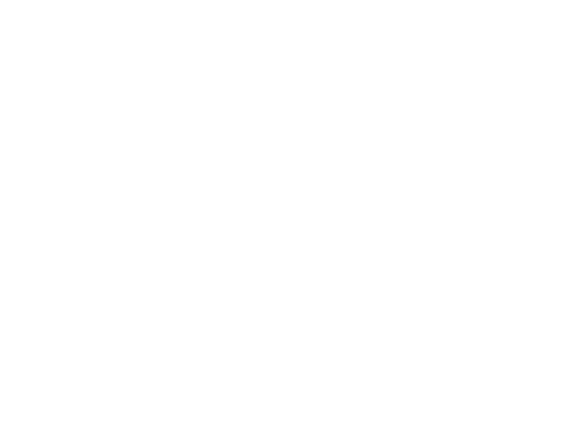

<IPython.core.display.Javascript object>


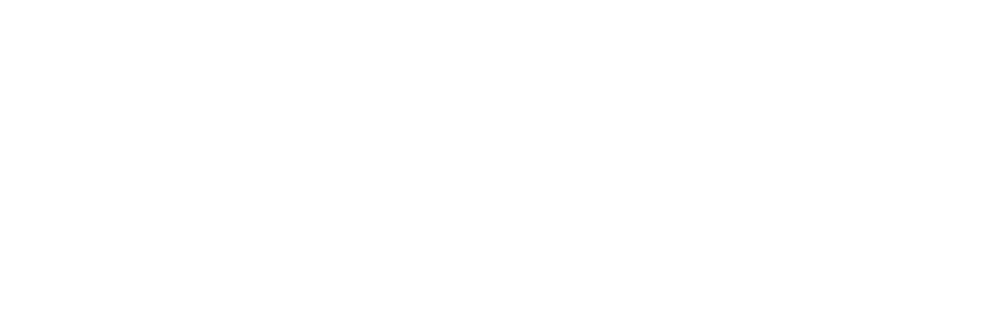

<IPython.core.display.Javascript object>


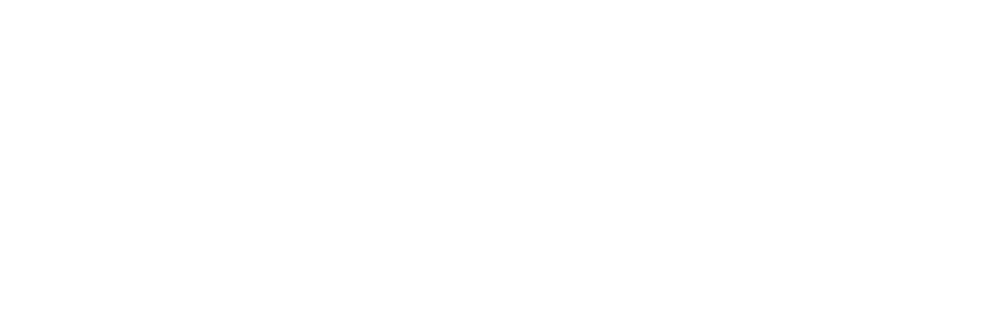

<IPython.core.display.Javascript object>


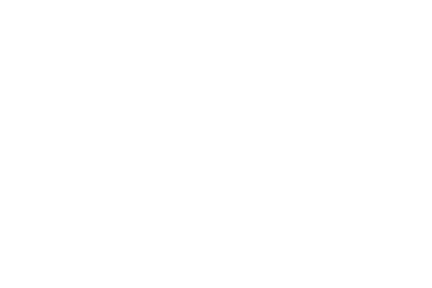

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial5.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


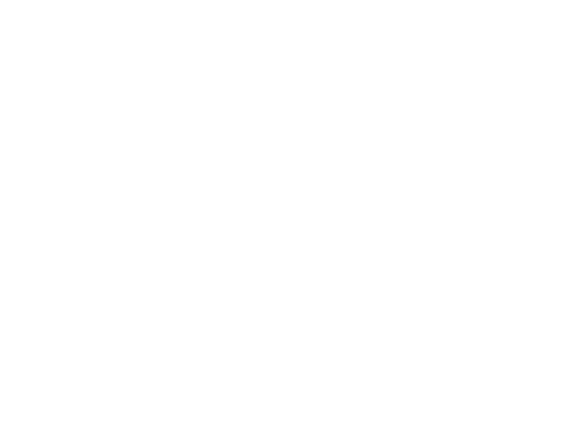

<IPython.core.display.Javascript object>


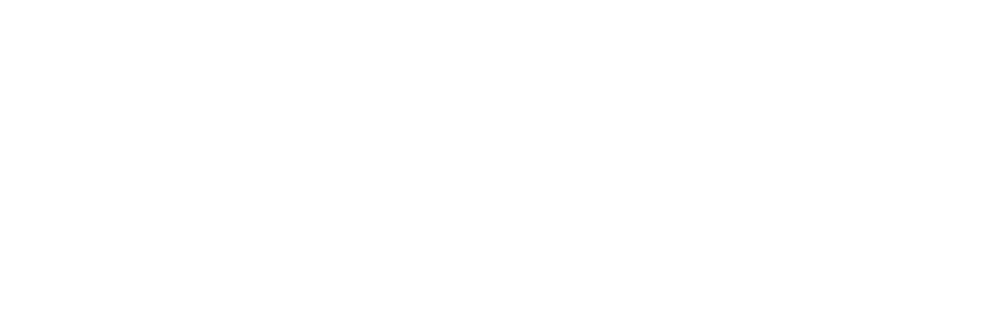

<IPython.core.display.Javascript object>


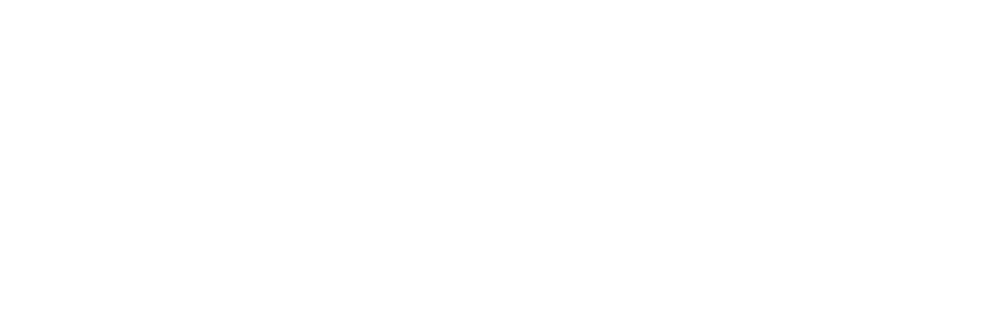

<IPython.core.display.Javascript object>


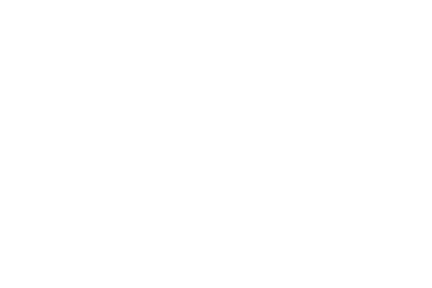

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial6.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


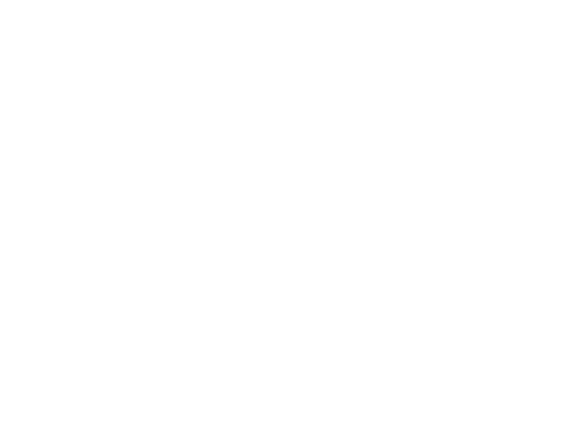

<IPython.core.display.Javascript object>


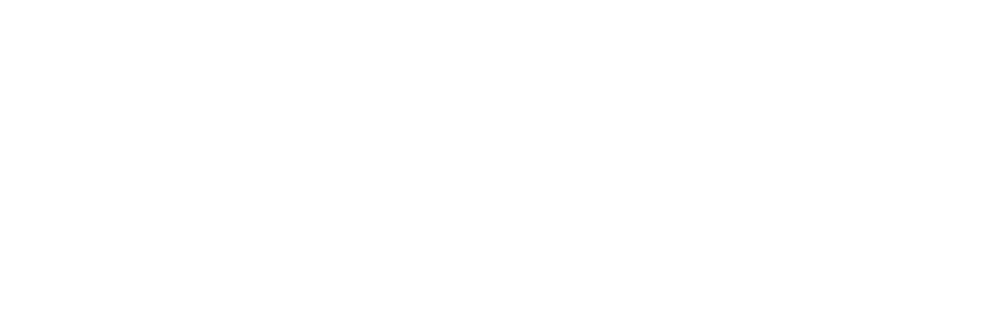

<IPython.core.display.Javascript object>


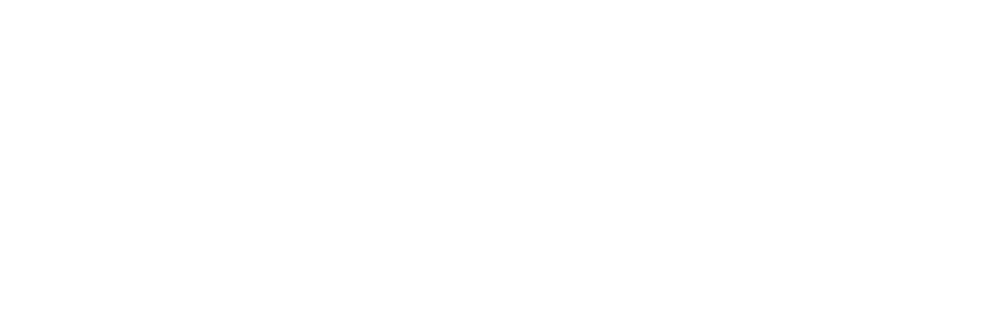

<IPython.core.display.Javascript object>


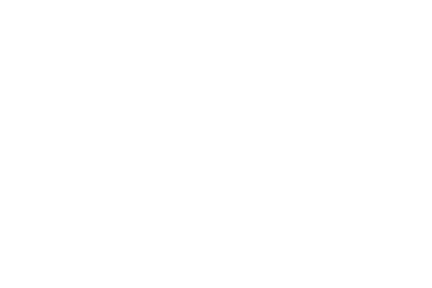

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial7.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


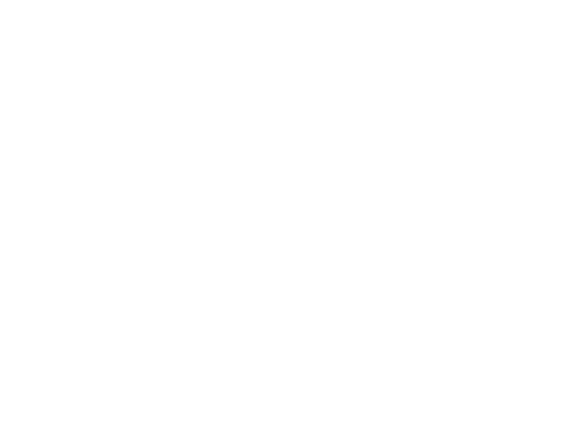

<IPython.core.display.Javascript object>


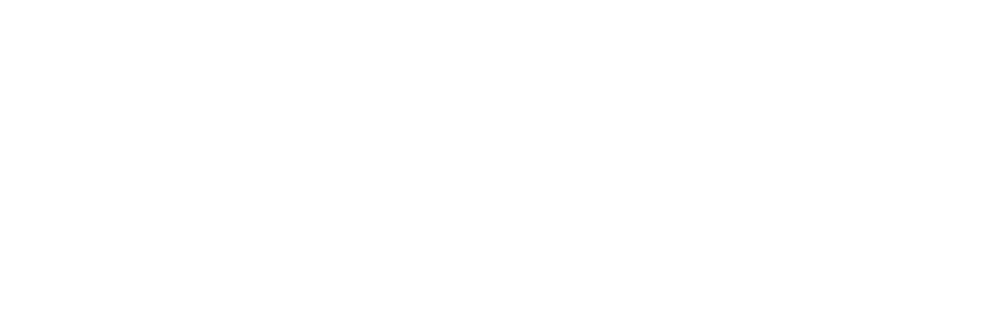

<IPython.core.display.Javascript object>


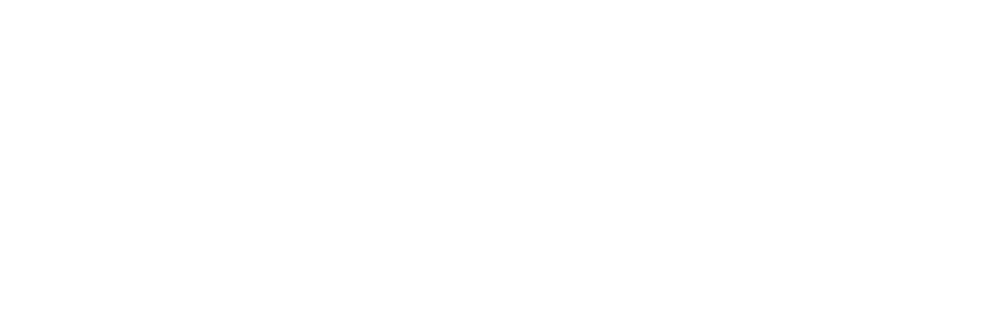

<IPython.core.display.Javascript object>


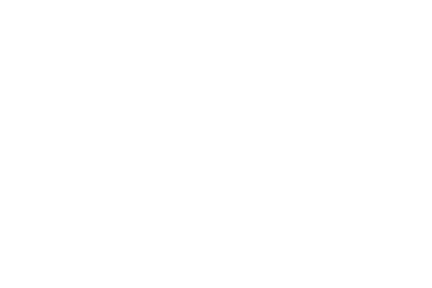

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial8.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


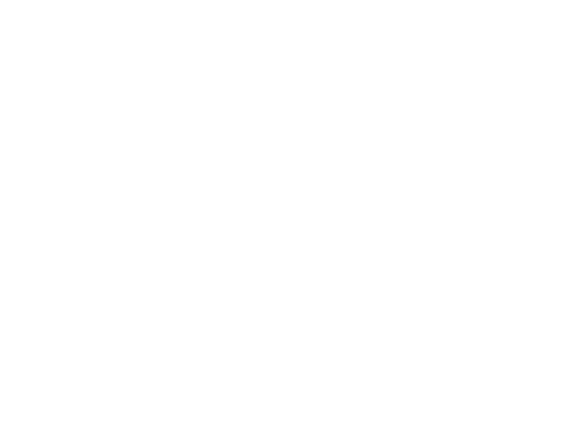

<IPython.core.display.Javascript object>


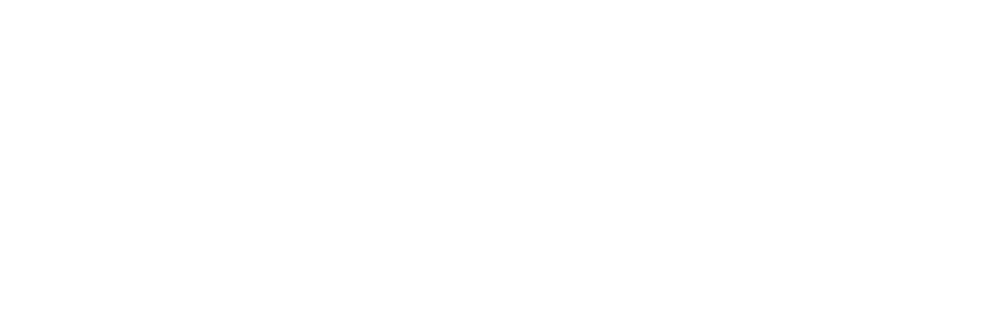

<IPython.core.display.Javascript object>


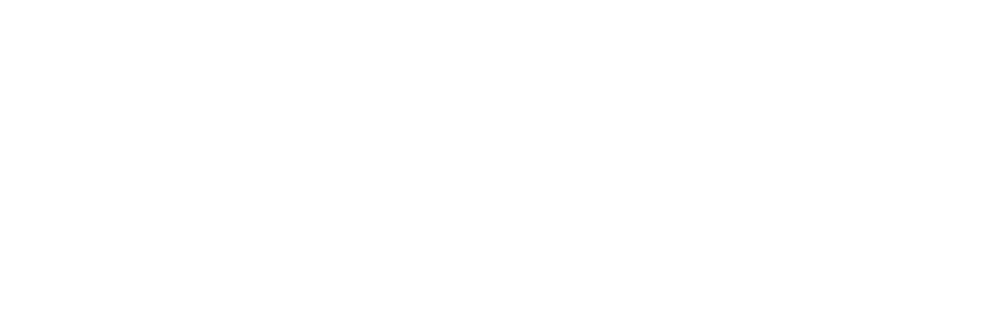

<IPython.core.display.Javascript object>


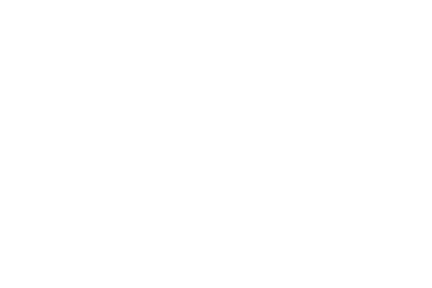

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial9.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChambe

<IPython.core.display.Javascript object>


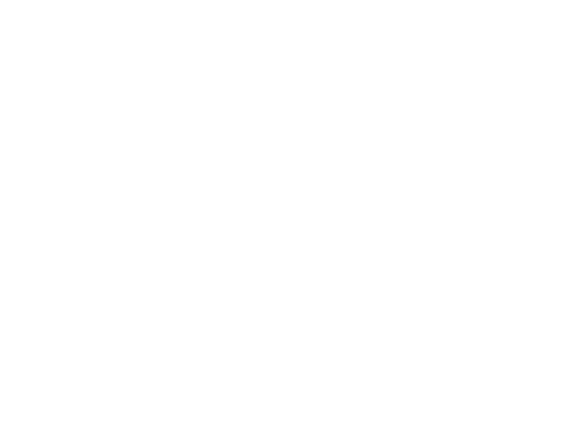

<IPython.core.display.Javascript object>


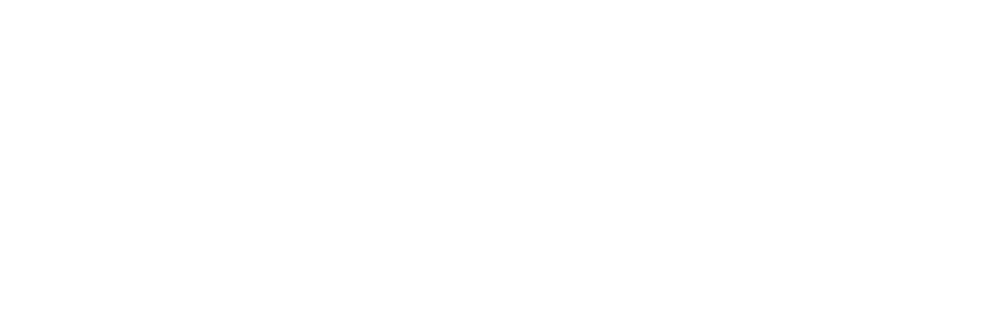

<IPython.core.display.Javascript object>


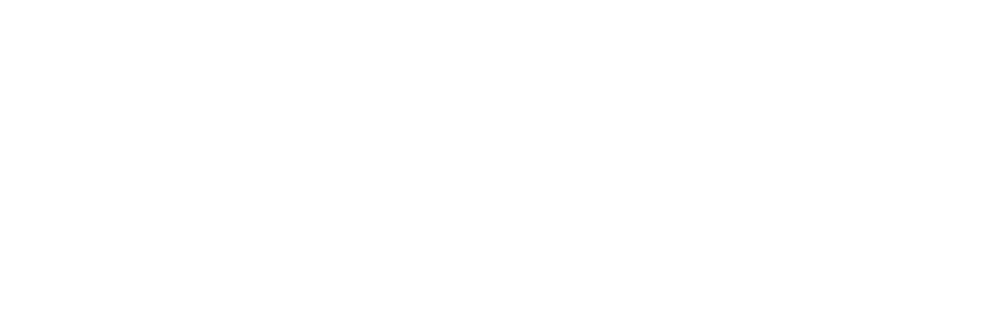

<IPython.core.display.Javascript object>


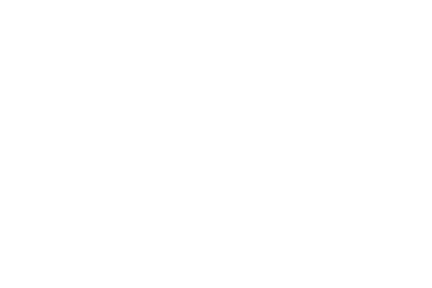

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial10.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


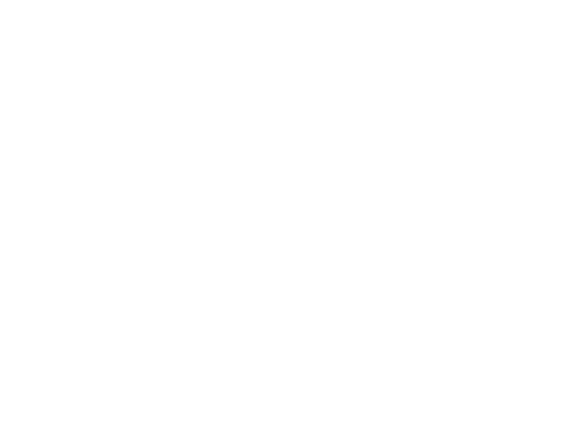

<IPython.core.display.Javascript object>


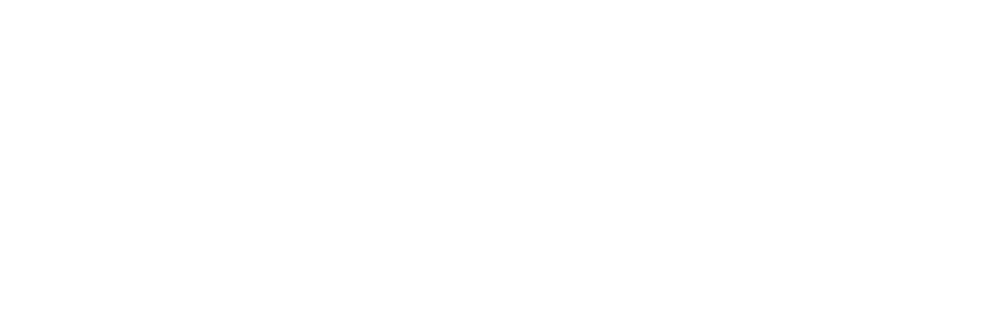

<IPython.core.display.Javascript object>


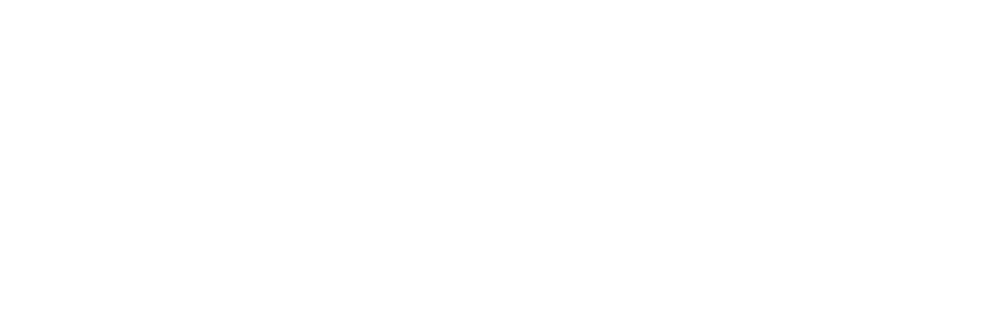

<IPython.core.display.Javascript object>


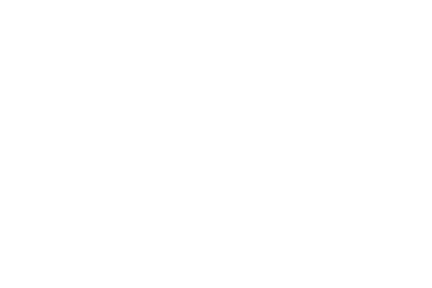

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial11.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


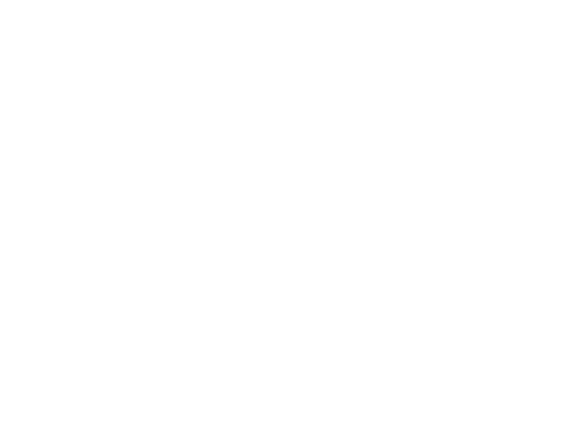

<IPython.core.display.Javascript object>


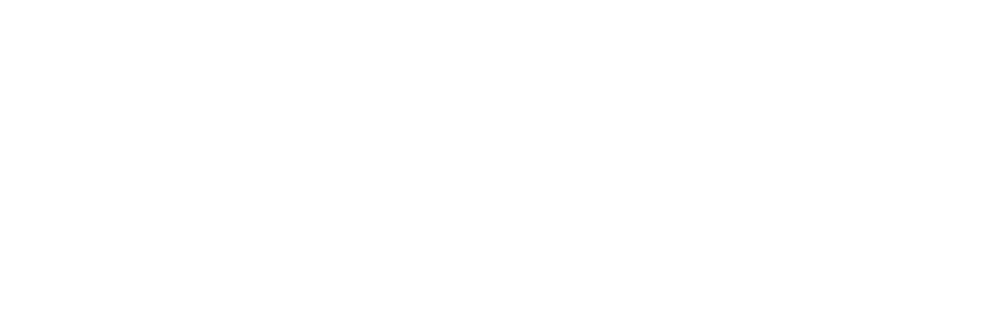

<IPython.core.display.Javascript object>


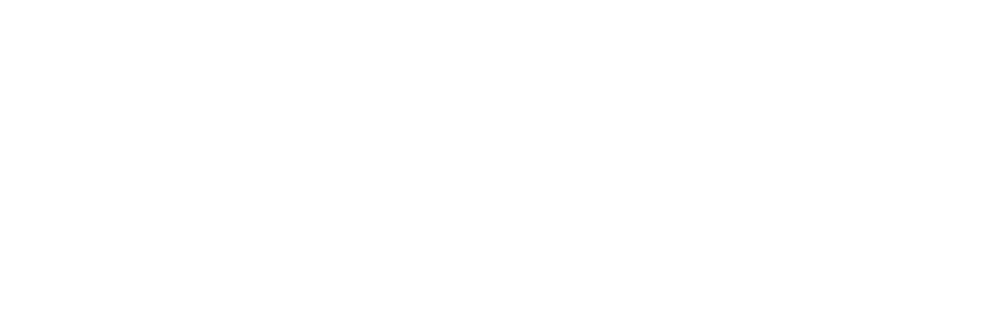

<IPython.core.display.Javascript object>


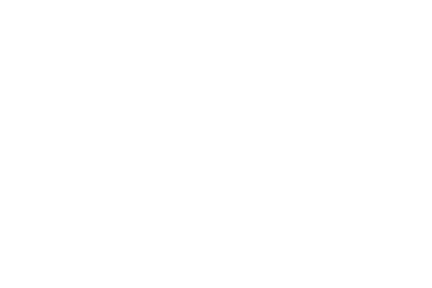

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial12.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


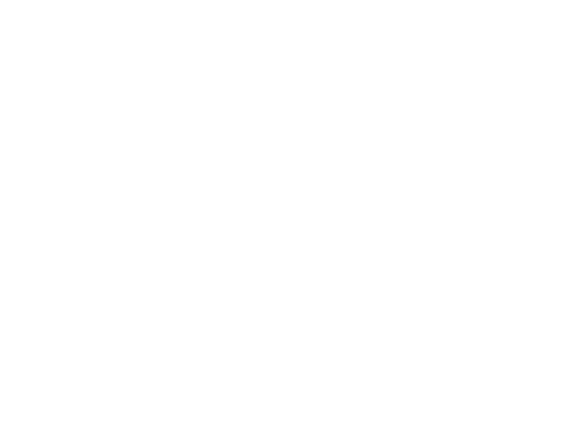

<IPython.core.display.Javascript object>


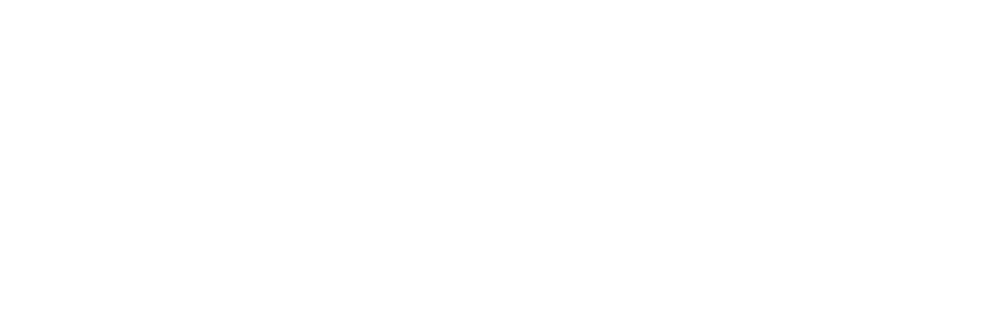

<IPython.core.display.Javascript object>


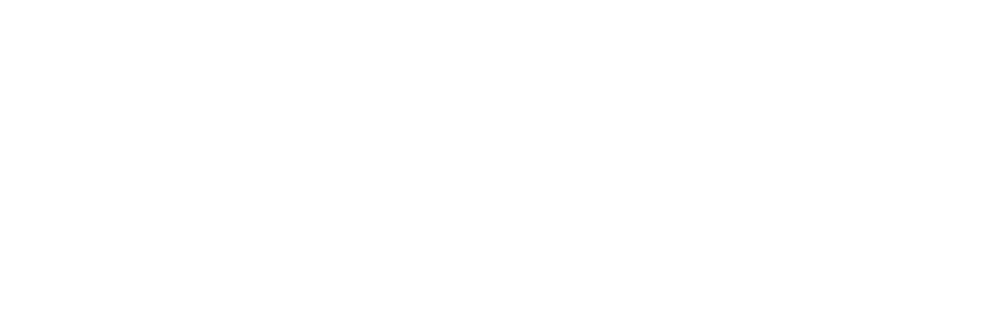

<IPython.core.display.Javascript object>


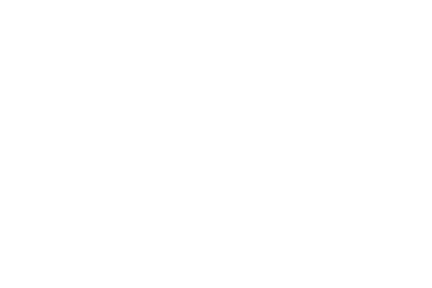

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial13.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


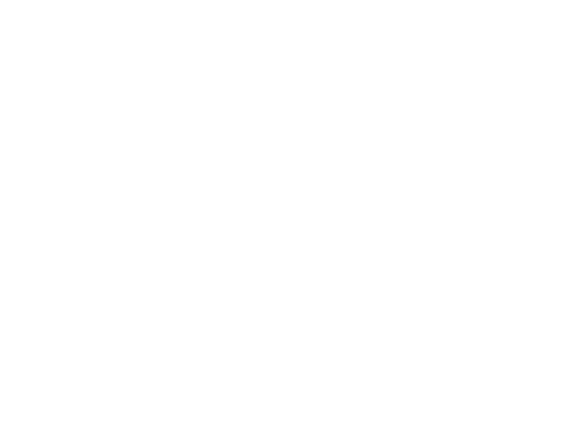

<IPython.core.display.Javascript object>


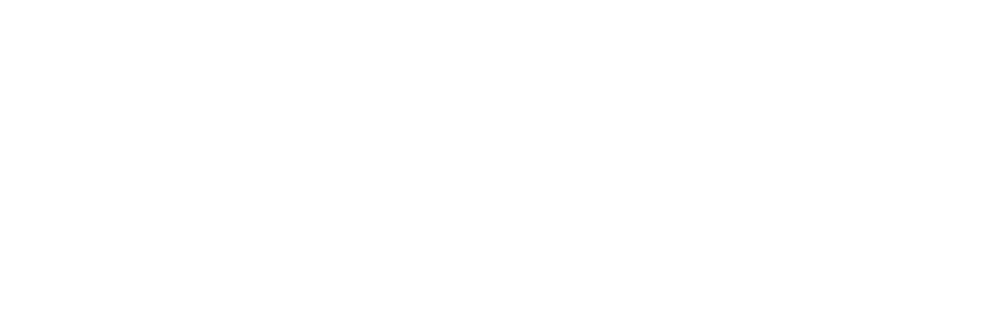

<IPython.core.display.Javascript object>


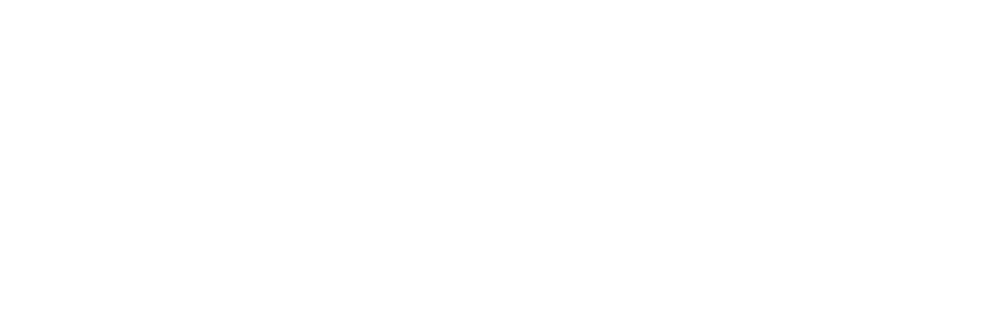

<IPython.core.display.Javascript object>


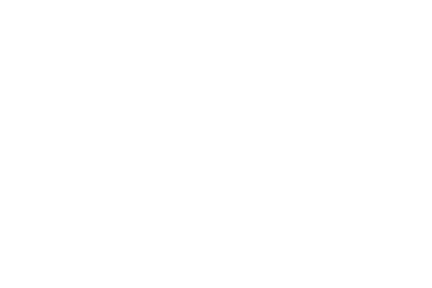

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial14.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


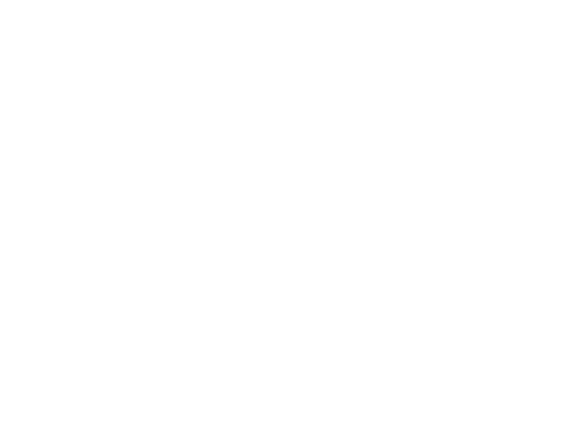

<IPython.core.display.Javascript object>


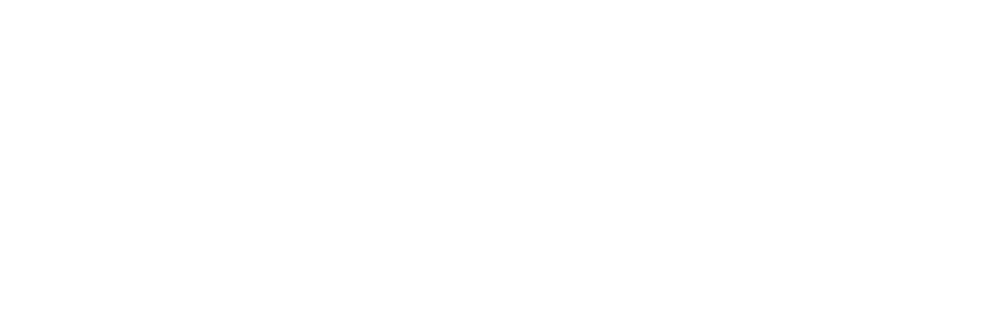

<IPython.core.display.Javascript object>


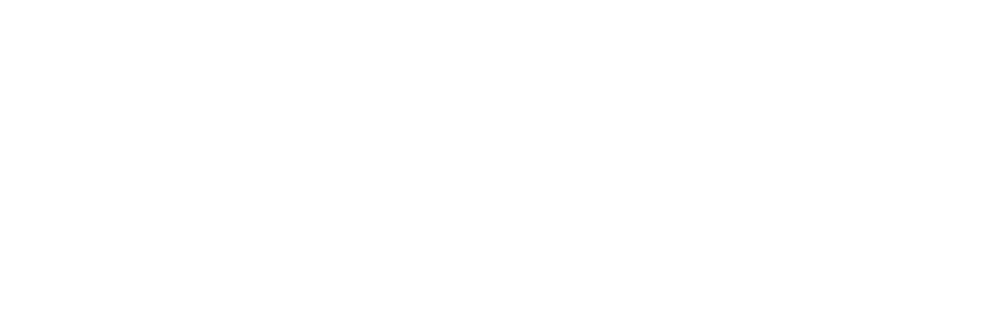

<IPython.core.display.Javascript object>


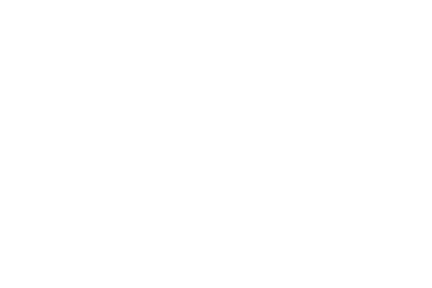

Plots created! Please check the directory "plot-poses" within the video directory
C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919\20180919_Trial15.mpg
Starting %  C:\Users\user\Desktop\Video_files_Deeplabcut\LinearChamber\20180919 ['C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial1.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial2.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial3.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial4.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial5.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial6.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamber\\20180906\\20180906_Trial7.mpg', 'C:\\Users\\user\\Desktop\\Video_files_Deeplabcut\\LinearChamb

<IPython.core.display.Javascript object>


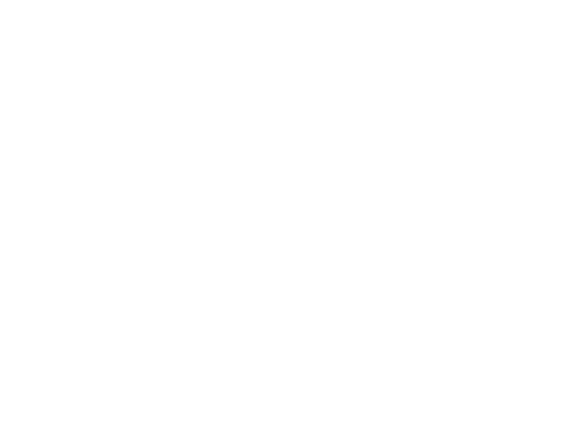

<IPython.core.display.Javascript object>


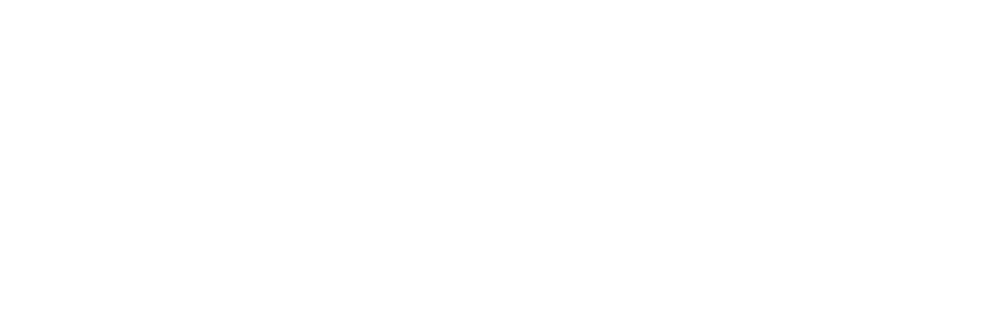

<IPython.core.display.Javascript object>


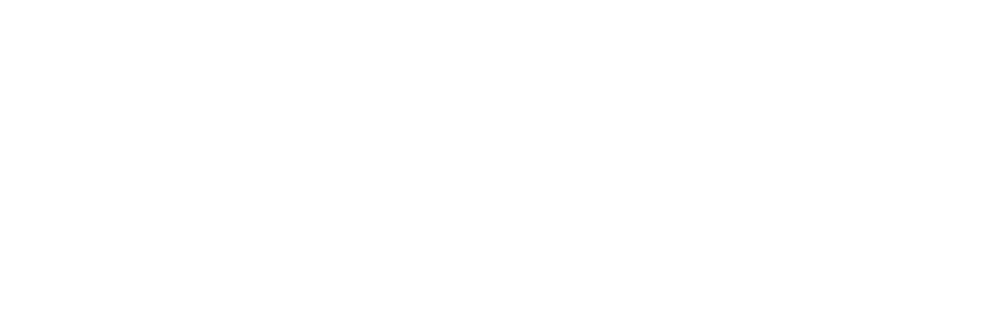

<IPython.core.display.Javascript object>


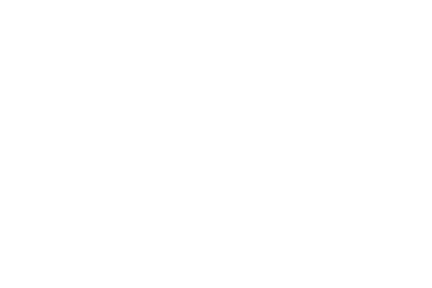

Plots created! Please check the directory "plot-poses" within the video directory


In [4]:
%matplotlib notebook
deeplabcut.plot_trajectories(path_config_file,videofile_path)